# Supervised

In [2]:
!pip install tensorflow==2.15

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 475.2/475.2 MB 3.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.7/1.7 MB 32.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.0/1.0 MB 30.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.5/5.5 MB 35.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 442.0/442.0 kB 20.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 77.9/77.9 kB 6.0 MB/s eta 0:00:00
  Attempting uninstall: wrapt
    Found existing installation: wrapt 1.16.0
    Uninstalling wrapt-1.16.0:
      Successfully uninstalled wrapt-1.16.0
  Attempting uninstall: ml-dtypes
    Found existing installation: ml-dtypes 0.4.1
    Uninstalling ml-dtypes-0.4.1:
      Successfully uninstalled ml-dtypes-0.4.1
  Attempting uninstall: keras
    Found existing installation: keras 3.4.1
    Uninstalling keras-3.4.1:
      Successfully uninstalled keras-3.4.1
  Attempting uninstall: tensorboard
    Found existing installation

In [3]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense
from tensorflow.keras.callbacks import ModelCheckpoint
from tensorflow.keras.layers import Dropout
from tensorflow.keras import regularizers
from tensorflow.keras.callbacks import LearningRateScheduler
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.layers import Input
from tensorflow.keras.models import Model

import matplotlib.pyplot as plt

In [4]:
import tensorflow
print(tensorflow.__version__)

2.15.0


In [5]:
# @title
epochs = 500
batch_size = 16

In [6]:
import scipy.io
import numpy as np

mat_data = scipy.io.loadmat('./Data_Simulation/data_new_v3.mat') 

# Initial Checks

In [14]:
mat_data

{'__header__': b'MATLAB 5.0 MAT-file, Platform: PCWIN64, Created on: Fri Sep 20 15:26:55 2024',
 '__version__': '1.0',
 '__globals__': [],
 'new_data': array([[(array([[[[-0.89131293+0.36529919j, -0.44404368-0.21571684j,
                   -0.4468215 -0.24708533j, ..., -0.89453503+0.3495453j ,
                   -0.90667636+0.33759265j, -0.89131293+0.36529919j],
                  [-0.88093918+0.38191131j, -0.44654253-0.20865096j,
                   -0.44964136-0.2398754j , ..., -0.88900002+0.3606861j ,
                   -0.89891738+0.35216855j, -0.88093918+0.38191131j],
                  [-0.86995385+0.39824984j, -0.44906571-0.2017278j ,
                   -0.45250245-0.23283667j, ..., -0.88327989+0.37175569j,
                   -0.89088325+0.36649495j, -0.86995385+0.39824984j],
                  ...,
                  [ 0.48601518-0.10576581j,  0.0492857 -0.33361258j,
                   -0.14596535-0.4592663j , ...,  0.41037714-0.14020837j,
                    0.45730748-0.08161483j,

In [ ]:
mat_data['data_new_v3'][0][0][0][:,:, 0,0]

array([[-0.89131293+0.36529919j, -0.06186744-0.19042467j],
       [-0.06186483-0.19042595j, -0.94756092+0.15960512j]])

In [ ]:
# Print the content
print(mat_data['data_new_v3'][0][0][0].shape)

(2, 2, 1001, 145)


In [ ]:
mat_data['data_new_v3'][0][0][0][:, :, 0, 0]

array([[-0.89131293+0.36529919j, -0.06186744-0.19042467j],
       [-0.06186483-0.19042595j, -0.94756092+0.15960512j]])

In [ ]:
for i in range(1):
  print(mat_data['data_new_v3'][0][0][0][i, :])

[[[-0.89131293+0.36529919j -0.44404368-0.21571684j
   -0.4468215 -0.24708533j ... -0.89453503+0.3495453j
   -0.90667636+0.33759265j -0.89131293+0.36529919j]
  [-0.88724348+0.37197988j -0.44503929-0.21287006j
   -0.4479431 -0.2441767j  ... -0.89234559+0.35401099j
   -0.90360913+0.34345723j -0.88724348+0.37197988j]
  [-0.88307432+0.37861591j -0.44603999-0.21004918j
   -0.44907285-0.24129937j ... -0.89012547+0.358465j
   -0.90049652+0.34927878j -0.88307432+0.37861591j]
  ...
  [ 0.45090598-0.1242417j   0.01309215-0.3590265j
   -0.19862516-0.49128069j ...  0.37608276-0.15775377j
    0.42553969-0.09962598j  0.45090598-0.1242417j ]
  [ 0.4376728 -0.12984186j -0.00113295-0.36752052j
   -0.21944333-0.50176466j ...  0.36328971-0.16311966j
    0.41357116-0.10516541j  0.4376728 -0.12984186j]
  [ 0.42360801-0.13504936j -0.01660373-0.37590624j
   -0.24213305-0.51192577j ...  0.34976245-0.16815259j
    0.40085788-0.11037597j  0.42360801-0.13504936j]]

 [[-0.06186744-0.19042467j  0.51591678-0.6521146

In [ ]:
print(mat_data['data_new_v3'][0][0][1].shape)

(145, 3)


In [ ]:
for i in range(10):
  print(mat_data['datanew'][0][0][1][:,:, :, i])

[[[-0.86570132+0.38310367j -0.85496521+0.39368257j
   -0.84368217+0.40362477j ...  0.68890667+0.20858736j
    0.68945938+0.20640016j  0.68999785+0.20420378j]
  [-0.08941916-0.19664524j -0.09756447-0.20212676j
   -0.10612392-0.20723958j ...  0.05783085-0.05409621j
    0.05795807-0.05366111j  0.05814043-0.05321635j]]

 [[-0.11723218-0.21020404j -0.12625068-0.21349844j
   -0.13552417-0.21636043j ...  0.0677823 -0.05339449j
    0.06802986-0.05392028j  0.06823816-0.05445299j]
  [-0.95659131+0.17724706j -0.95084208+0.18872538j
   -0.94416237+0.20000231j ... -0.65921265+0.28089011j
   -0.6590097 +0.28165576j -0.65876347+0.2824344j ]]]
[[[-0.92876697+0.12952596j -0.94073367+0.12644033j
   -0.95452535+0.1298309j  ...  0.52643734+0.28387567j
    0.53042942+0.28261378j  0.53452176+0.28033039j]
  [ 0.01849695-0.20674758j  0.02065374-0.2266801j
    0.01357647-0.24516264j ... -0.2463669 -0.18781553j
   -0.24549405-0.18456404j -0.24426453-0.18218859j]]

 [[ 0.02891231-0.25573584j  0.00987105-0.270414

 # Plots

In [ ]:
plots = True

if plots:
  X = mat_data['data_new_v3'][0][0][0]
  X = np.transpose(X, (3, 0, 1, 2)).reshape((145, 2 * 2, 1001))
  y = mat_data['data_new_v3'][0][0][1]

  print(X.shape, y.shape)

(145, 4, 1001) (145, 3)


In [ ]:
X.shape[0]

145

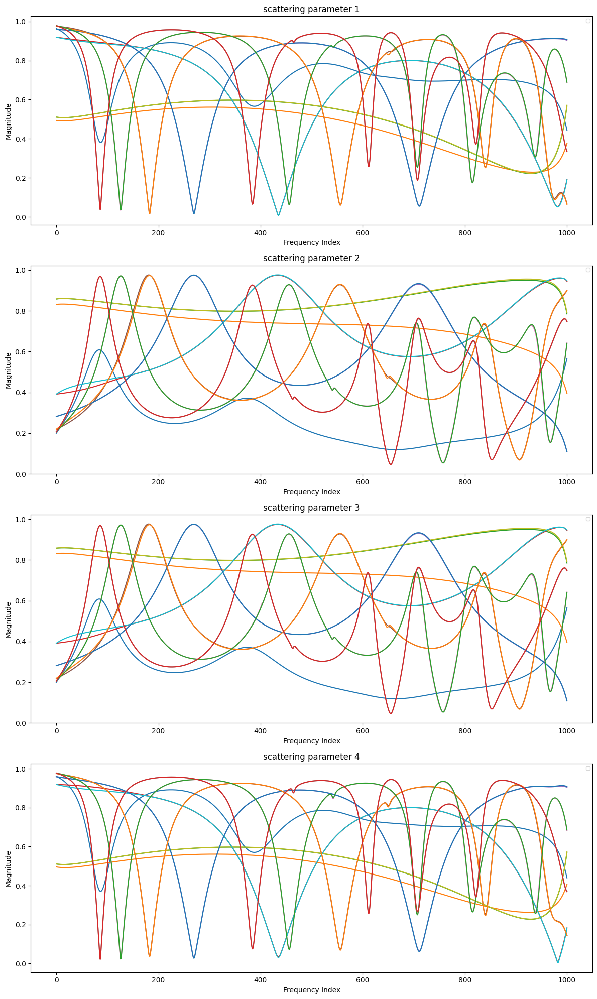

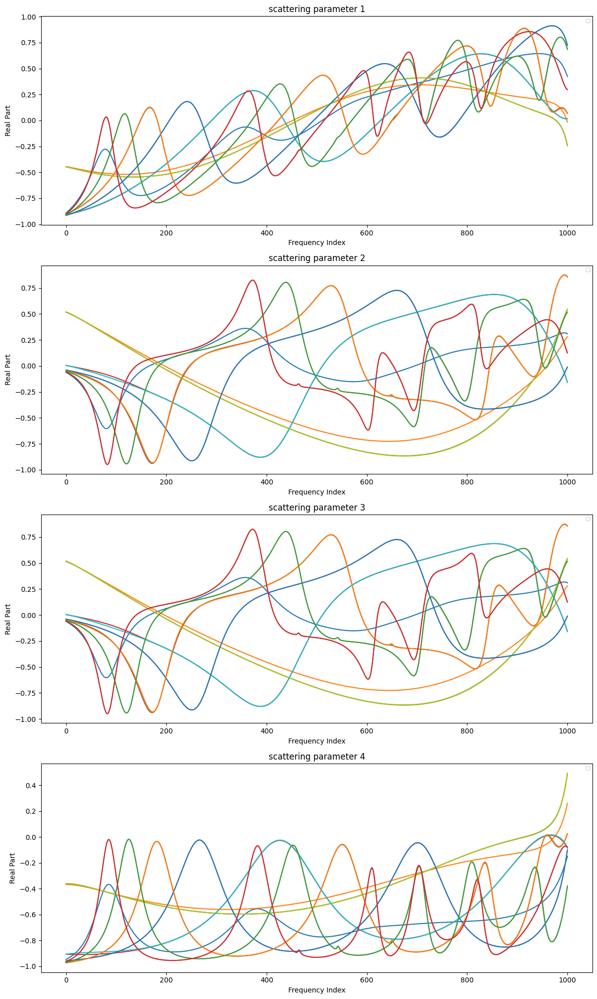

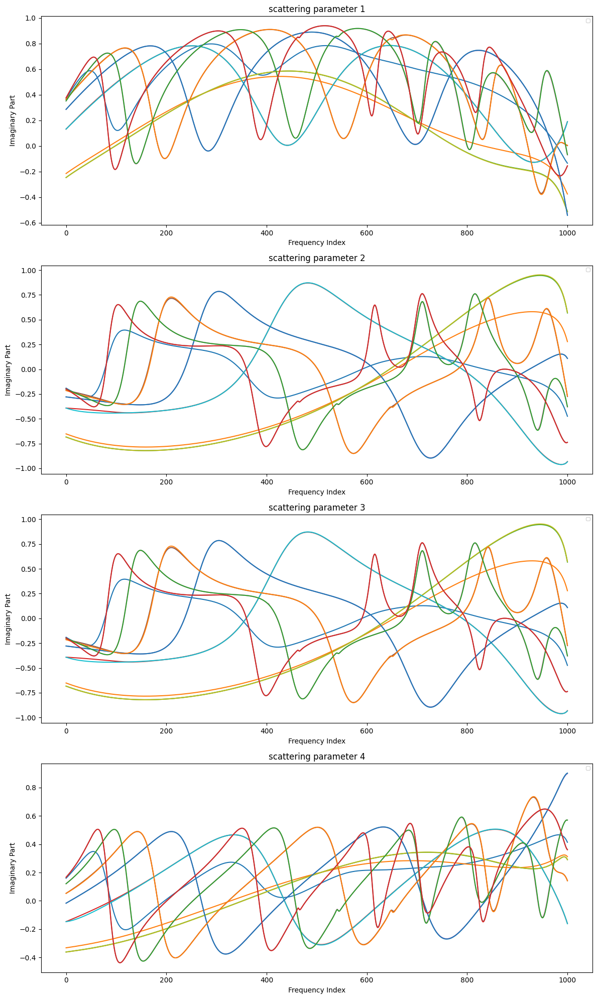

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

# reshaped_data = data.reshape(145, 4, 1001)

plots_number = X.shape[1]
legends_number = int(0.1*X.shape[0])

if plots:
  # Plotting the graphs: magnitude
  fig, axs = plt.subplots(plots_number, 1, figsize=(12, 20))

  for i in range(plots_number):
      for j in range(legends_number):
          axs[i].plot(np.arange(1001), np.abs(X[j, i, :])) #, label=f'Label {j+1}'
      axs[i].set_title(f'scattering parameter {i+1}')
      axs[i].set_xlabel('Frequency Index')
      axs[i].set_ylabel('Magnitude')
      axs[i].legend(loc='upper right', fontsize='x-small')

  plt.tight_layout()
  plt.show()

  # Plotting the graphs: real
  fig, axs = plt.subplots(plots_number, 1, figsize=(12, 20))

  for i in range(plots_number):
      for j in range(legends_number):
          axs[i].plot(np.arange(1001), np.real(X[j, i, :])) #, label=f'Label {j+1}'
      axs[i].set_title(f'scattering parameter {i+1}')
      axs[i].set_xlabel('Frequency Index')
      axs[i].set_ylabel('Real Part')
      axs[i].legend(loc='upper right', fontsize='x-small')

  plt.tight_layout()
  plt.show()

  # Plotting the graphs: imaginary
  fig, axs = plt.subplots(plots_number, 1, figsize=(12, 20))

  for i in range(plots_number):
      for j in range(legends_number):
          axs[i].plot(np.arange(1001), np.imag(X[j, i, :])) #, label=f'Label {j+1}'
      axs[i].set_title(f'scattering parameter {i+1}')
      axs[i].set_xlabel('Frequency Index')
      axs[i].set_ylabel('Imaginary Part')
      axs[i].legend(loc='upper right', fontsize='x-small')

  plt.tight_layout()
  plt.show()

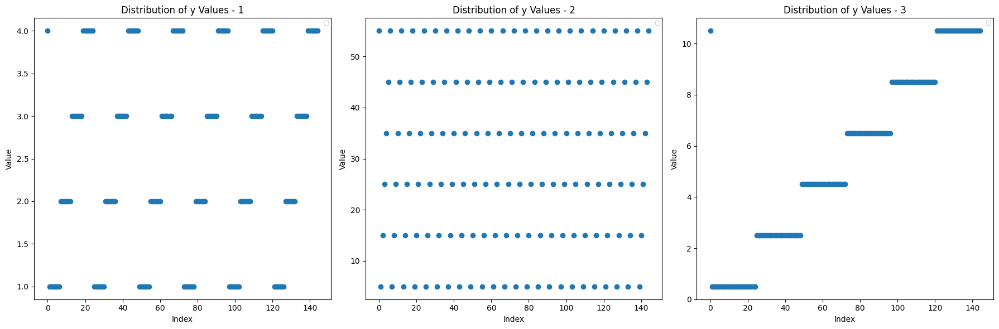

In [ ]:
if plots:
  # Plotting the distribution of values in y
  fig, axs = plt.subplots(1, 3, figsize=(18, 6))

  for i in range(3):
      axs[i].scatter(np.arange(145), y[:, i])
      axs[i].set_title(f'Distribution of y Values - {i+1}')
      axs[i].set_xlabel('Index')
      axs[i].set_ylabel('Value')
      axs[i].legend(loc='upper right', fontsize='x-small')

  plt.tight_layout()
  plt.show()

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.signal import find_peaks

resonance_frequencies_peaks_S11_list = []
resonance_frequencies_dips_S11_list = []
resonance_frequencies_peaks_S21_list = []
resonance_frequencies_dips_S21_list = []

for i in range(X.shape[0]):
  frequencies = np.arange(1001)
  S11_magnitude = np.abs(X[i, 0, :])
  S21_magnitude = np.abs(X[i, 2, :])

  # Find peaks in the magnitude of S11 and S21
  peaks_S11, _ = find_peaks(S11_magnitude)
  peaks_S21, _ = find_peaks(S21_magnitude)
  dips_S11, _ = find_peaks(-S11_magnitude)
  dips_S21, _ = find_peaks(-S21_magnitude)

  # # Plot the magnitude of S11 and S21 with identified peaks
  # plt.figure(figsize=(14, 6))

  # plt.subplot(1, 2, 1)
  # plt.plot(frequencies, S11_magnitude, label='|S11|')
  # plt.plot(frequencies[peaks_S11], S11_magnitude[peaks_S11], 'rx', label='Resonance Peaks')
  # plt.plot(frequencies[dips_S11], S11_magnitude[dips_S11], 'go', label='Resonance Dips')
  # plt.title('Magnitude of S11')
  # plt.xlabel('Frequency (Hz)')
  # plt.ylabel('Magnitude')
  # plt.legend()

  # plt.subplot(1, 2, 2)
  # plt.plot(frequencies, S21_magnitude, label='|S21|')
  # plt.plot(frequencies[peaks_S21], S21_magnitude[peaks_S21], 'rx', label='Resonance Peaks')
  # plt.plot(frequencies[dips_S21], S21_magnitude[dips_S21], 'go', label='Resonance Dips')
  # plt.title('Magnitude of S21')
  # plt.xlabel('Frequency (Hz)')
  # plt.ylabel('Magnitude')
  # plt.legend()

  # plt.tight_layout()
  # plt.show()

  # Print the resonance frequencies
  resonance_frequencies_S11 = 0.95 + (4.2 - 0.95)*frequencies[peaks_S11]/1001
  resonance_frequencies_S21 = 0.95 + (4.2 - 0.95)*frequencies[peaks_S21]/1001
  resonance_frequencies_S11_ = 0.95 + (4.2 - 0.95)*frequencies[dips_S11]/1001
  resonance_frequencies_S21_ = 0.95 + (4.2 - 0.95)*frequencies[dips_S21]/1001

  resonance_frequencies_peaks_S11_list.append(resonance_frequencies_S11)
  resonance_frequencies_dips_S11_list.append(resonance_frequencies_S11_)
  resonance_frequencies_peaks_S21_list.append(resonance_frequencies_S21)
  resonance_frequencies_dips_S21_list.append(resonance_frequencies_S21_)

  # print(f"Resonance frequencies from S11: {resonance_frequencies_S11, resonance_frequencies_S11_}")
  # print(f"Resonance frequencies from S21: {resonance_frequencies_S21, resonance_frequencies_S21_}")

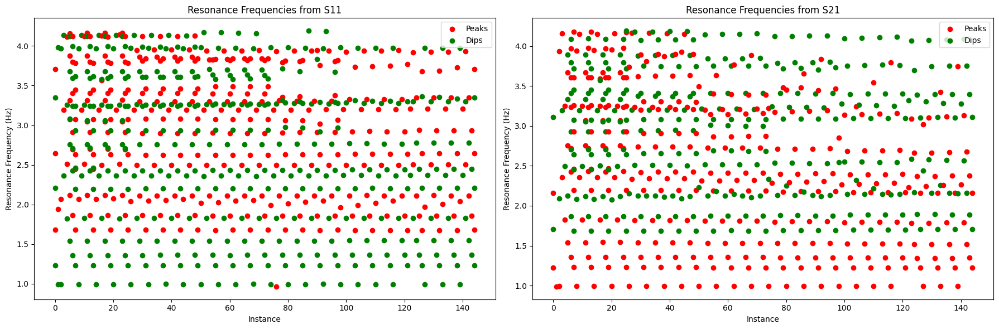

In [ ]:
# Create scatter plots for resonance frequencies from S11 and S21
fig, axs = plt.subplots(1, 2, figsize=(18, 6))

# Plot resonance frequencies for S11
for i, (peaks, dips) in enumerate(zip(resonance_frequencies_peaks_S11_list, resonance_frequencies_dips_S11_list)):
    axs[0].scatter([i] * len(peaks), peaks, color='red', label='Peaks' if i == 0 else "")
    axs[0].scatter([i] * len(dips), dips, color='green', label='Dips' if i == 0 else "")

axs[0].set_title('Resonance Frequencies from S11')
axs[0].set_xlabel('Instance')
axs[0].set_ylabel('Resonance Frequency (Hz)')
axs[0].legend()

# Plot resonance frequencies for S21
for i, (peaks, dips) in enumerate(zip(resonance_frequencies_peaks_S21_list, resonance_frequencies_dips_S21_list)):
    axs[1].scatter([i] * len(peaks), peaks, color='red', label='Peaks' if i == 0 else "")
    axs[1].scatter([i] * len(dips), dips, color='green', label='Dips' if i == 0 else "")

axs[1].set_title('Resonance Frequencies from S21')
axs[1].set_xlabel('Instance')
axs[1].set_ylabel('Resonance Frequency (Hz)')
axs[1].legend()

plt.tight_layout()
plt.show()

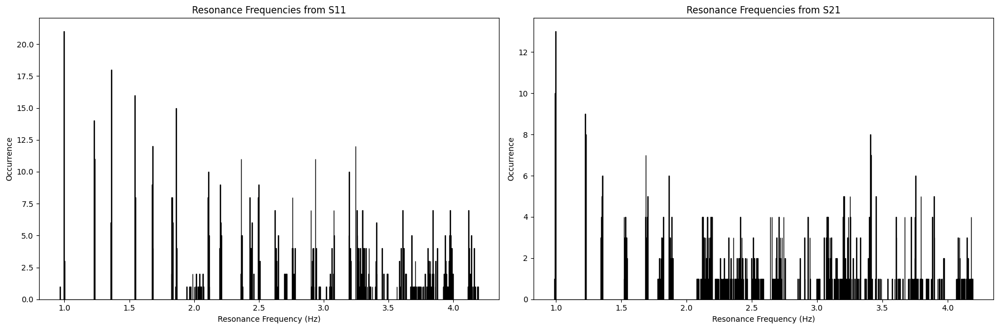

In [ ]:
# Flatten lists of resonance frequencies for histogram plotting
resonance_frequencies_S11 = np.concatenate(resonance_frequencies_peaks_S11_list + resonance_frequencies_dips_S11_list)
resonance_frequencies_S21 = np.concatenate(resonance_frequencies_peaks_S21_list + resonance_frequencies_dips_S21_list)

# Create histograms for resonance frequencies from S11 and S21
fig, axs = plt.subplots(1, 2, figsize=(18, 6))

# Plot histogram for resonance frequencies from S11
axs[0].hist(resonance_frequencies_S11, bins=1001, color='blue', edgecolor='black')
axs[0].set_title('Resonance Frequencies from S11')
axs[0].set_xlabel('Resonance Frequency (Hz)')
axs[0].set_ylabel('Occurrence')

# Plot histogram for resonance frequencies from S21
axs[1].hist(resonance_frequencies_S21, bins=1001, color='blue', edgecolor='black')
axs[1].set_title('Resonance Frequencies from S21')
axs[1].set_xlabel('Resonance Frequency (Hz)')
axs[1].set_ylabel('Occurrence')

plt.tight_layout()
plt.show()

# Dataset Preparation

In [12]:
original_shape = False
parallel_branch = False

without_eps_inf = True

with_magnitude_separate = False
with_real_symmetry = False
with_real_only = False
with_imaginary_mag_only = False
with_magnitude_only = False

freq_1001_points = True
freq_401_points = False

In [13]:
if freq_1001_points:
  if original_shape and not(parallel_branch):
    X = mat_data['data_new_v3'][0][0][0]
    X = np.transpose(X, (3, 0, 1, 2))
    if without_eps_inf:
      y = mat_data['data_new_v3'][0][0][1][:, 1:]
    else:
      y = mat_data['data_new_v3'][0][0][1]

  elif parallel_branch and not(original_shape):
    X = mat_data['data_new_v3'][0][0][0].reshape((2 * 2, 1001, 145))
    X = np.transpose(X, (2, 0, 1))
    if without_eps_inf:
      y = mat_data['data_new_v3'][0][0][1][:, 1:]
    else:
      y = mat_data['data_new_v3'][0][0][1]

  else:
    if with_magnitude_separate:
      X = mat_data['data_new_v3'][0][0][0].reshape((2 * 2 * 1001, 145)).T
      X = np.concatenate((np.imag(X), np.real(X)), axis=1)
      if without_eps_inf:
        y = mat_data['data_new_v3'][0][0][1][:, 1:]
      else:
        y = mat_data['data_new_v3'][0][0][1]

    elif with_real_symmetry:
      X = mat_data['data_new_v3'][0][0][0]
      X = np.real(X)
      X = np.array([X[0, 0, :, :], X[1, 0, :, :]]).reshape((2 * 1001, 145)).T
      if without_eps_inf:
        y = mat_data['data_new_v3'][0][0][1][:, 1:]
      else:
        y = mat_data['data_new_v3'][0][0][1]

    elif with_real_only:
      X = mat_data['data_new_v3'][0][0][0].reshape((2 * 2 * 1001, 145)).T
      X = np.real(X)
      if without_eps_inf:
        y = mat_data['data_new_v3'][0][0][1][:, 1:]
      else:
        y = mat_data['data_new_v3'][0][0][1]

    elif with_imaginary_mag_only:
      X = mat_data['data_new_v3'][0][0][0].reshape((2 * 2 * 1001, 145)).T
      X = np.imag(X)
      if without_eps_inf:
        y = mat_data['data_new_v3'][0][0][1][:, 1:]
      else:
        y = mat_data['data_new_v3'][0][0][1]

    elif with_magnitude_only:
      X = mat_data['data_new_v3'][0][0][0].reshape((2 * 2 * 1001, 145)).T
      X = np.abs(X)
      if without_eps_inf:
        y = mat_data['data_new_v3'][0][0][1][:, 1:]
      else:
        y = mat_data['data_new_v3'][0][0][1]

    else:
      X = mat_data['data_new_v3'][0][0][0].reshape((2 * 2 * 1001, 145)).T
      if without_eps_inf:
        y = mat_data['data_new_v3'][0][0][1][:, 1:]
      else:
        y = mat_data['data_new_v3'][0][0][1]

elif freq_401_points:
  if original_shape and not(parallel_branch):
    X = mat_data['new_data'][0][0][0]
    X = np.transpose(X, (3, 0, 1, 2))
    if without_eps_inf:
      y = mat_data['new_data'][0][0][1][:, 1:]
    else:
      y = mat_data['new_data'][0][0][1]

  elif parallel_branch and not(original_shape):
    X = mat_data['new_data'][0][0][0].reshape((2 * 2, 401, 145))
    X = np.transpose(X, (2, 0, 1))
    if without_eps_inf:
      y = mat_data['new_data'][0][0][1][:, 1:]
    else:
      y = mat_data['new_data'][0][0][1]

  else:
    if with_magnitude_separate:
      X = mat_data['new_data'][0][0][0].reshape((2 * 2 * 401, 145)).T
      X = np.concatenate((np.imag(X), np.real(X)), axis=1)
      if without_eps_inf:
        y = mat_data['new_data'][0][0][1][:, 1:]
      else:
        y = mat_data['new_data'][0][0][1]

    elif with_real_symmetry:
      X = mat_data['new_data'][0][0][0]
      X = np.real(X)
      X = np.array([X[0, 0, :, :], X[1, 0, :, :]]).reshape((2 * 401, 145)).T
      if without_eps_inf:
        y = mat_data['new_data'][0][0][1][:, 1:]
      else:
        y = mat_data['new_data'][0][0][1]

    elif with_real_only:
      X = mat_data['new_data'][0][0][0].reshape((2 * 2 * 401, 145)).T
      X = np.real(X)
      if without_eps_inf:
        y = mat_data['new_data'][0][0][1][:, 1:]
      else:
        y = mat_data['dnew_data'][0][0][1]

    elif with_imaginary_mag_only:
      X = mat_data['new_data'][0][0][0].reshape((2 * 2 * 401, 145)).T
      X = np.imag(X)
      if without_eps_inf:
        y = mat_data['new_data'][0][0][1][:, 1:]
      else:
        y = mat_data['new_data'][0][0][1]

    elif with_magnitude_only:
      X = mat_data['new_data'][0][0][0].reshape((2 * 2 * 401, 145)).T
      X = np.abs(X)
      if without_eps_inf:
        y = mat_data['new_data'][0][0][1][:, 1:]
      else:
        y = mat_data['new_data'][0][0][1]

    else:
      X = mat_data['new_data'][0][0][0].reshape((2 * 2 * 401, 145)).T
      if without_eps_inf:
        y = mat_data['new_data'][0][0][1][:, 1:]
      else:
        y = mat_data['new_data'][0][0][1]

In [14]:
eps_inf_with_eps_sta_tau = False

if eps_inf_with_eps_sta_tau:
  X = np.concatenate((X, y[:, 1:]), axis=1)
  y = y[:, 0]

# Just testing uniqueness

In [ ]:
X = np.unique(X, axis=0)
X

array([[-0.91543294+0.28509937j, -0.91396232+0.28939361j,
        -0.91246633+0.29367961j, ..., -0.15345251+0.90375832j,
        -0.12788212+0.90683646j, -0.10134513+0.90911604j],
       [-0.91539388+0.28515646j, -0.9136413 +0.28933394j,
        -0.91187258+0.29350365j, ..., -0.15258395+0.89934503j,
        -0.1266069 +0.90275885j, -0.09946687+0.9054563j ],
       [-0.91531768+0.28531522j, -0.91384469+0.28961251j,
        -0.9123463 +0.29390147j, ..., -0.15193476+0.89748359j,
        -0.12643926+0.90034704j, -0.09998905+0.90239517j],
       ...,
       [-0.44487806-0.22159438j, -0.44586946-0.21870308j,
        -0.4468697 -0.21584274j, ...,  0.25262761+0.31514508j,
         0.27104521+0.31182311j,  0.29046498+0.30744854j],
       [-0.44473296-0.22357222j, -0.44573663-0.22068165j,
        -0.44674872-0.21782196j, ...,  0.26384854+0.32300992j,
         0.28275284+0.31992092j,  0.30270933+0.315765j  ],
       [-0.44404368-0.21571684j, -0.44503929-0.21287006j,
        -0.44603999-0.21004918

In [ ]:
X.shape

(144, 4004)

In [ ]:
all_complex = np.all(np.iscomplex(X))
all_complex

True

# Train-test split

In [22]:
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25, random_state=42)

# Real-valued model

In [23]:
X_train.shape

(108, 1604)

In [26]:
y_test.shape

(37, 2)

In [27]:
y_train[0]

array([55. ,  4.5])

In [ ]:
mse_list_eps = []
mae_list_eps = []
mean_percentage_error_list_eps = []
r2_list_eps = []
pearson_list_eps = []
spearman_list_eps = []

mse_list_tau = []
mae_list_tau = []
mean_percentage_error_list_tau = []
r2_list_tau = []
pearson_list_tau = []
spearman_list_tau = []

experiment_count = 0

In [ ]:
def learning_rate_schedule(epoch, initial_lr=0.001):
    """
    Custom learning rate schedule. Adjust the learning rate based on the current epoch.
    You can customize this function to fit your needs.
    """
    if epoch < 300 or epoch == 300:
        return initial_lr  # Keep the initial learning rate for the first 50 epochs
    elif epoch > 300 and epoch%50 == 0:
        initial_lr = initial_lr * 0.9  # Reduce the learning rate by a factor of 10 after epoch 50
        return initial_lr
    else:
        return initial_lr

# Create the Adam optimizer with the initial learning rate
initial_learning_rate = 0.001
adam_optimizer = Adam(learning_rate=initial_learning_rate)

lr_scheduler = LearningRateScheduler(learning_rate_schedule)

checkpoint_1 = ModelCheckpoint('best_model_1_treating_as_real.h5', monitor='val_loss', save_best_only=True, verbose=1)

In [ ]:
model_1 = Sequential([
    Dense(256, activation='selu', kernel_regularizer=regularizers.l2(0.01), input_shape=(4004,)),
    Dense(64, activation='selu', kernel_regularizer=regularizers.l2(0.01)),
    Dense(8, activation='selu', kernel_regularizer=regularizers.l2(0.01)),
    Dense(64, activation='selu', kernel_regularizer=regularizers.l2(0.01)),
    Dense(256, activation='selu', kernel_regularizer=regularizers.l2(0.01)),
    Dense(8, activation='selu', kernel_regularizer=regularizers.l2(0.01)),
    # Dense(16, activation='selu', kernel_regularizer=regularizers.l2(0.01)),
    Dense(2)
])

In [ ]:
# Compile the model
model_1.compile(optimizer=adam_optimizer, loss='mean_squared_error')
model_1.summary()

model_1.fit(X_train, y_train, epochs=epochs+500, batch_size=batch_size, validation_data=(X_test, y_test), callbacks=[checkpoint_1, lr_scheduler])

loss_1 = model_1.evaluate(X_test, y_test)
print("Test Loss:", loss_1)

predictions_1 = model_1.predict(X_test)

errors_1 = np.abs(predictions_1 - y_test)

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_7 (Dense)             (None, 256)               1025280   
                                                                 
 dense_8 (Dense)             (None, 64)                16448     
                                                                 
 dense_9 (Dense)             (None, 8)                 520       
                                                                 
 dense_10 (Dense)            (None, 64)                576       
                                                                 
 dense_11 (Dense)            (None, 256)               16640     
                                                                 
 dense_12 (Dense)            (None, 8)                 2056      
                                                                 
 dense_13 (Dense)            (None, 2)                

In [ ]:
# Load the best model
best_model = tf.keras.models.load_model('best_model_1_treating_as_real.h5')

# Evaluate the best model on the test data
test_loss = best_model.evaluate(X_test, y_test)
print(f"Test Loss (MSE) with Best Model: {test_loss}") 

2/2 [==============================] - 0s 9ms/step - loss: 6.1420
Test Loss (MSE) with Best Model: 6.142037868499756


In [ ]:
preds = best_model.predict(X_test)

2/2 [==============================] - 0s 6ms/step


In [ ]:
from sklearn.metrics import mean_absolute_error, r2_score, mean_squared_error

for i in range(preds.shape[1]):

    if y_test.ndim < 2:
      y_test = np.expand_dims(y_test, axis=1)

    mse = mean_squared_error(y_test[:, i], preds[:, i])

    # Mean Absolute Error
    mae = mean_absolute_error(y_test[:, i], preds[:, i])

    # Mean Percentage Error
    mean_percentage_error = np.mean(np.abs((y_test[:, i] - preds[:, i]) / (y_test[:, i]))) * 100

    # Coefficient of Determination (R²)
    r2 = r2_score(y_test[:, i], preds[:, i])

    if i%2==0:
      mse_list_eps.append(mse)
      mae_list_eps.append(mae)
      mean_percentage_error_list_eps.append(mean_percentage_error)
      r2_list_eps.append(r2)
    else:
      mse_list_tau.append(mse)
      mae_list_tau.append(mae)
      mean_percentage_error_list_tau.append(mean_percentage_error)
      r2_list_tau.append(r2)

# Print the metrics for each column
# for i in range(y_test.shape[1]):
#     print(f"Metrics for column {i + 1}:")
#     print(f"Mean Squared Error (MSE): {mse_list[i]}")
#     print(f"Mean Absolute Error (MAE): {mae_list[i]}")
#     print(f"Mean Percentage Error: {mean_percentage_error_list[i]:.2f}%")
#     print(f"Coefficient of Determination (R²): {r2_list[i]}")
#     print("\n")

In [ ]:
import numpy as np
from scipy.stats import pearsonr, spearmanr, kendalltau

if preds.shape[1] == 1:
  pearson_corr, _ = pearsonr(y_test.flatten(), preds.flatten())         # [:, i] Pearson correlation coefficient
  spearman_corr, _ = spearmanr(y_test.flatten(), preds.flatten())       # Spearman rank correlation coefficient
  kendall_corr, _ = kendalltau(y_test.flatten(), preds.flatten())

  print(f"pearson: {pearson_corr}, spearman: {spearman_corr}, kendall: {kendall_corr}")

  pearson_list_eps.append(pearson_corr)
  spearman_list_eps.append(spearman_corr)

else:
  for i in range(preds.shape[1]):
    # Calculate different correlation coefficients
    pearson_corr, _ = pearsonr(y_test[:, i].flatten(), preds[:, i].flatten())         # [:, i] Pearson correlation coefficient
    spearman_corr, _ = spearmanr(y_test[:, i].flatten(), preds[:, i].flatten())       # Spearman rank correlation coefficient
    kendall_corr, _ = kendalltau(y_test[:, i].flatten(), preds[:, i].flatten())

    print(f"pearson: {pearson_corr}, spearman: {spearman_corr}, kendall: {kendall_corr}")

    if i%2==0:
      pearson_list_eps.append(pearson_corr)
      spearman_list_eps.append(spearman_corr)

    else:
      pearson_list_tau.append(pearson_corr)
      spearman_list_tau.append(spearman_corr)

experiment_count += 1

pearson: 0.9942394283905576, spearman: 0.9778849065556829, kendall: 0.9070958178840991


In [ ]:
print(experiment_count)
print(mae_list_eps)
print(np.mean(mse_list_eps), np.std(mse_list_eps), np.mean(mae_list_eps), np.std(mae_list_eps), np.mean(mean_percentage_error_list_eps), np.std(mean_percentage_error_list_eps),np.mean(r2_list_eps), np.std(r2_list_eps), np.mean(pearson_list_eps), np.std(pearson_list_eps), np.mean(spearman_list_eps), np.std(spearman_list_eps))
print(" ")
print(np.mean(mse_list_tau), np.std(mse_list_tau), np.mean(mae_list_tau), np.std(mae_list_tau), np.mean(mean_percentage_error_list_tau), np.std(mean_percentage_error_list_tau),np.mean(r2_list_tau), np.std(r2_list_tau), np.mean(pearson_list_tau), np.std(pearson_list_tau), np.mean(spearman_list_tau), np.std(spearman_list_tau))

4
[0.8683309812803526, 0.9377207498292666, 0.9372945476222683, 0.8396725525727143]
3.809505503295808 0.2673821414068701 0.8957547078261504 0.04296503196561027 7.358936250212133 0.2023133239204418 0.9867432307218811 0.0009304681026588818 0.9937378587496187 0.00041254179258105303 0.9778849065556829 0.0
 
nan nan nan nan nan nan nan nan nan nan nan nan


/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3504: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:129: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:206: RuntimeWarning: Degrees of freedom <= 0 for slice
  ret = _var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:163: RuntimeWarning: invalid value encountered in divide
  arrmean = um.true_divide(arrmean, div, out=arrmean,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:198: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)


In [ ]:
import numpy as np
from scipy.stats import pearsonr, spearmanr, kendalltau

if preds.shape[1] == 1:
  pearson_corr, _ = pearsonr(y_test.flatten(), preds.flatten())         # [:, i] Pearson correlation coefficient
  spearman_corr, _ = spearmanr(y_test.flatten(), preds.flatten())       # Spearman rank correlation coefficient
  kendall_corr, _ = kendalltau(y_test.flatten(), preds.flatten())

  print(f"pearson: {pearson_corr}, spearman: {spearman_corr}, kendall: {kendall_corr}")

else:
  for i in range(preds.shape[1]):
    # Calculate different correlation coefficients
    pearson_corr, _ = pearsonr(y_test[:, i].flatten(), preds[:, i].flatten())         # [:, i] Pearson correlation coefficient
    spearman_corr, _ = spearmanr(y_test[:, i].flatten(), preds[:, i].flatten())       # Spearman rank correlation coefficient
    kendall_corr, _ = kendalltau(y_test[:, i].flatten(), preds[:, i].flatten())

    print(f"pearson: {pearson_corr}, spearman: {spearman_corr}, kendall: {kendall_corr}")

pearson: 0.9911139537855453, spearman: 0.9778849065556829, kendall: 0.9070958178840991
pearson: 0.9623655208008887, spearman: 0.9514609734778271, kendall: 0.8582406437208909


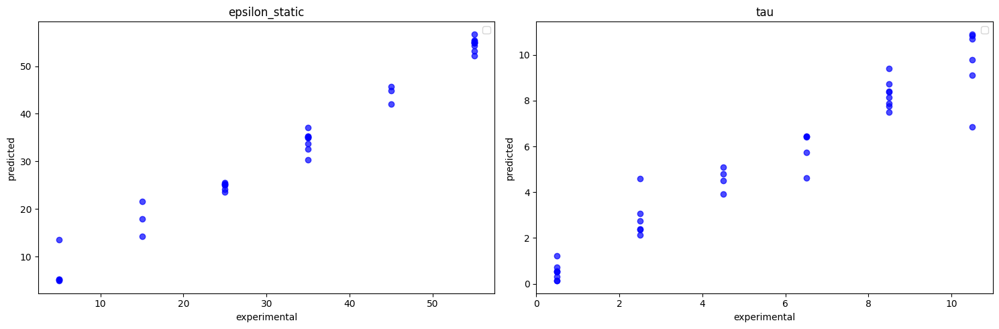

In [ ]:
import matplotlib.pyplot as plt

fig, axs = plt.subplots(1, preds.shape[1], figsize=(15, 5))

if preds.shape[1] == 2:
  titles = ['epsilon_static', 'tau']
else:
  titles = ['epsilon_inf', 'epsilon_static', 'tau']

for i in range(preds.shape[1]):
    axs[i].scatter(y_test[:, i], preds[:, i], color='b', alpha=0.7) # label=f'Column {i+1}', [:, i]
    axs[i].set_xlabel(f'experimental')
    axs[i].set_ylabel(f'predicted')
    axs[i].set_title(titles[i])
    axs[i].legend()

plt.tight_layout()
plt.show()

In [ ]:
!pip install keras-tuner==1.4.5

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 129.5/129.5 kB 6.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 950.8/950.8 kB 38.4 MB/s eta 0:00:00


In [ ]:
import keras_tuner as kt
from tensorflow.keras import regularizers
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense

def build_model(hp):
    model = Sequential()

    # Input layer
    model.add(Dense(
        units=hp.Int('units_input', min_value=32, max_value=1024, step=32),
        activation='relu',
        kernel_regularizer=regularizers.l2(0.01),
        input_shape=(4004,)
    ))

    # Hidden layers
    for i in range(hp.Int('num_layers', 1, 5)):
        model.add(Dense(
            units=hp.Int(f'units_{i}', min_value=32, max_value=1024, step=64),
            activation='relu',
            kernel_regularizer=regularizers.l2(0.01)
        ))

    # Output layer
    model.add(Dense(2))

    model.compile(optimizer='adam', loss='mean_squared_error')
    return model

# Initialize the tuner
tuner = kt.Hyperband(
    build_model,
    objective='val_loss',
    max_epochs=50,
    hyperband_iterations=10,
    directory='my_dir_',
    project_name='hyperparameter_tuning'
)

# Search for the best hyperparameters
tuner.search(X_train, y_train, epochs=50, validation_data=(X_test, y_test), callbacks=[checkpoint_1, lr_scheduler])

# Get the optimal hyperparameters
best_hps = tuner.get_best_hyperparameters(num_trials=1)[0]

print(f"""
The optimal number of units in the input layer is {best_hps.get('units_input')}.
The optimal number of hidden layers is {best_hps.get('num_layers')}.
""")
for i in range(best_hps.get('num_layers')):
    print(f"The optimal number of units in layer {i + 1} is {best_hps.get(f'units_{i}')}.")

# Build the model with the optimal hyperparameters and train it
best_model = tuner.hypermodel.build(best_hps)
history = best_model.fit(X_train, y_train, epochs=epochs, validation_data=(X_test, y_test), callbacks=[checkpoint_1, lr_scheduler])

# Evaluate the best model
test_loss = best_model.evaluate(X_test, y_test)
print(f"Test Loss with Best Model: {test_loss}")

# Make predictions
predictions = best_model.predict(X_test)

# Compute additional metrics
for i in range(y_test.shape[1]):
    mae = mean_absolute_error(y_test[:, i], predictions[:, i])
    mean_percentage_error = np.mean(np.abs((y_test[:, i] - predictions[:, i]) / y_test[:, i])) * 100
    pearson_corr, _ = pearsonr(y_test[:, i], predictions[:, i])
    spearman_corr, _ = spearmanr(y_test[:, i], predictions[:, i])
    r2 = r2_score(y_test[:, i], predictions[:, i])
    print(f"Metrics for column {i + 1}:")
    print(f"Mean Absolute Error (MAE): {mae}")
    print(f"Mean Percentage Error: {mean_percentage_error:.2f}%")
    print(f"Pearson Correlation Coefficient: {pearson_corr}")
    print(f"Spearman Correlation Coefficient: {spearman_corr}")
    print(f"Coefficient of Determination (R²): {r2}")
    print("\n")

Trial 284 Complete [00h 00m 03s]
val_loss: 177.707275390625

Best val_loss So Far: 19.65093231201172
Total elapsed time: 01h 06m 50s

Search: Running Trial #285

Value             |Best Value So Far |Hyperparameter
544               |224               |units_input
1                 |3                 |num_layers
480               |800               |units_0
800               |32                |units_1
480               |992               |units_2
416               |800               |units_3
96                |608               |units_4
2                 |50                |tuner/epochs
0                 |0                 |tuner/initial_epoch
3                 |0                 |tuner/bracket
0                 |0                 |tuner/round

Epoch 1/2
1/4 [======>.......................] - ETA: 2s - loss: 613.2499
Epoch 1: val_loss improved from inf to 184.27867, saving model to best_model_1_treating_as_real.h5


In [ ]:
import tensorflow as tf
import keras_tuner
# from keras_tuner.tuners import RandomSearch
# from kerastuner.engine.hyperparameters import HyperParameters
from tensorflow.keras.layers import Dense
from tensorflow.keras.optimizers import Adam

# Define a function to build the model with variable neurons
def build_model(hp):
    model_complex = tf.keras.models.Sequential()
    model_complex.add(Dense(1024, activation='relu', kernel_regularizer=regularizers.l2(0.01), input_shape=(4004,)))

    # Define the number of neurons for each layer as a hyperparameter
    # units = [hp.Int(f'units_{i}', min_value=8, max_value=512, step=8, sampling="linear") for i in range(4)]
    units = [hp.Choice(f'units_{i}', [64, 128, 256, 512]) for i in range(5)] #, 1024, 2048

    print(units)

    # Add ComplexDense layers with variable number of neurons
    for i, num_units in enumerate(units):
        model_complex.add(Dense(units=num_units, activation='relu', kernel_regularizer=regularizers.l2(0.01)))

    model_complex.add(Dense(units=32, activation='relu', kernel_regularizer=regularizers.l2(0.01)))
    # Add ComplexToReal and Dense output layer
    # model_complex.add(ComplexToReal())
    model_complex.add(Dense(units=2, activation='linear'))

    # Compile the model
    model_complex.compile(loss='mean_squared_error', optimizer=Adam(), metrics=['mean_squared_error'])

    # model_complex.summary()

    return model_complex

# Initialize Hyperparameters object
hp = keras_tuner.HyperParameters()

# hp.Float(
#     "learning_rate",
#     min_value=0.0001,
#     max_value=1,
#     step=10,
#     sampling="log")

build_model(hp)

# Define the tuner
tuner = keras_tuner.RandomSearch(
    hypermodel = build_model,
    objective=keras_tuner.Objective("val_loss", direction="min"),
    max_trials=50,  # Adjust the number of trials as needed
    tune_new_entries=False,
    loss="mean_squared_error",
    metrics=["mean_squared_error"],
    executions_per_trial=1,
    hyperparameters=hp,
    overwrite=True,
    directory='nas_logs',
    project_name='complex_model_nas'
)

checkpoint_1 = ModelCheckpoint('best_model_1_treating_as_real.h5', monitor='val_loss', save_best_only=True, verbose=1)

tuner.search(X_train, y_train, batch_size = batch_size, validation_data=(X_test, y_test), epochs=epochs, callbacks=[lr_scheduler])  # Adjust epochs as needed; checkpoint_1,
# Perform the search
tuner.search_space_summary()

# Get the best model
best_model = tuner.get_best_models(num_models=1)[0]

Trial 5 Complete [00h 05m 30s]
val_loss: 9.197270393371582

Best val_loss So Far: 9.197270393371582
Total elapsed time: 00h 27m 20s

Search: Running Trial #6

Value             |Best Value So Far |Hyperparameter
512               |128               |units_0
256               |64                |units_1
512               |256               |units_2
512               |256               |units_3
512               |256               |units_4

[512, 256, 512, 512, 512]
Epoch 1/500
7/7 [==============================] - 3s 198ms/step - loss: 401.6942 - mean_squared_error: 363.5351 - val_loss: 356.6163 - val_mean_squared_error: 321.7635 - lr: 0.0010
Epoch 2/500
7/7 [==============================] - 1s 172ms/step - loss: 233.0316 - mean_squared_error: 200.0029 - val_loss: 212.5825 - val_mean_squared_error: 181.8927 - lr: 0.0010
Epoch 3/500
7/7 [==============================] - 1s 162ms/step - loss: 160.6414 - mean_squared_error: 131.2563 - val_loss: 134.2265 - val_mean_squared_error: 106.496

KeyboardInterrupt: 

# Feature importance

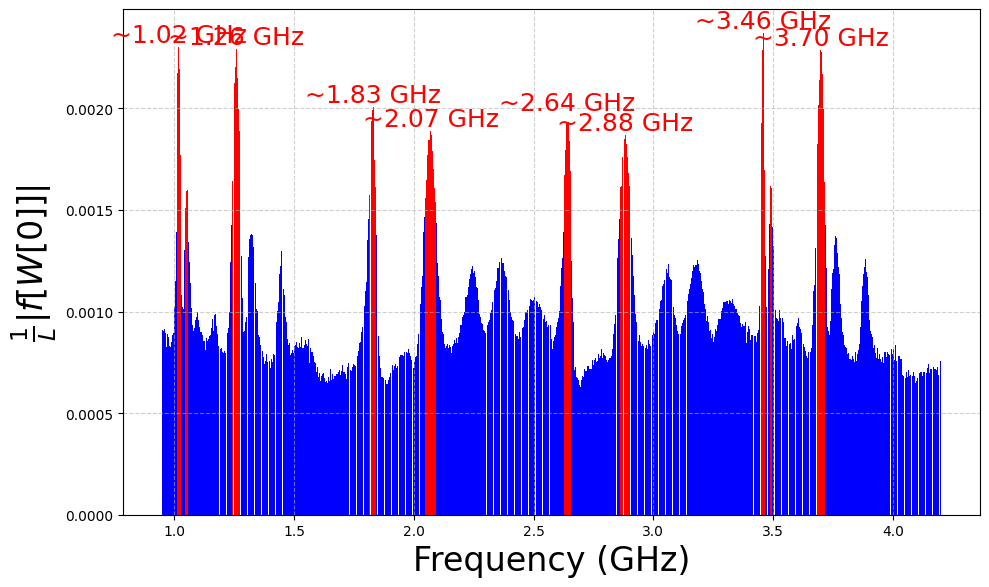

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

# Assuming best_model is already loaded and has been trained

# Get the weights of the first dense layer
weights = best_model.layers[0].get_weights()[0]  # Shape: (4004, number_of_neurons_in_first_layer)

# Calculate the importance of each input feature (summing absolute values across neurons)
feature_importance = np.sum(np.abs(weights), axis=1)  # Shape: (4004,)

# Initialize an array to store the aggregated feature importance for each frequency
aggregated_importance = np.zeros(1001)

# Sum each set of 4 weights to the corresponding frequency
for i in range(1001):
    aggregated_importance[i] = np.sum(feature_importance[4*i : 4*(i+1)])

# Normalize the aggregated importance
aggregated_importance = aggregated_importance / np.sum(aggregated_importance)

np.savetxt('/content/aggregated_importance.csv', aggregated_importance, delimiter=",")

# Create the frequency array
frequencies = np.linspace(0.95, 4.2, 1001)

# Set a threshold for highlighting
threshold = 0.0015  # Adjust this value as needed

# Identify frequencies with importance above the threshold
above_threshold = aggregated_importance > threshold

# Plot the feature importance against frequency
plt.figure(figsize=(10, 6))

# Plot bars below the threshold in one color (e.g., blue)
plt.bar(frequencies[~above_threshold], aggregated_importance[~above_threshold],
        width=0.003, color='blue', label='Below Threshold')

# Plot bars above the threshold in a different color (e.g., red) and highlight them
plt.bar(frequencies[above_threshold], aggregated_importance[above_threshold],
        width=0.003, color='red', label='Above Threshold')

# prev_freq = 0.95
# # Highlight the frequencies where the importance is above the threshold
# for freq, importance in zip(frequencies[above_threshold], aggregated_importance[above_threshold]):
#     if np.abs(prev_freq - freq) > 0.05:
#       if prev_freq > freq:
#         plt.text(freq, importance, f'~{freq:.2f} GHz', ha='right', va='bottom', fontsize=14, color='red')
#         prev_freq = freq

sorted_indices = np.argsort(frequencies[above_threshold])
sorted_frequencies = frequencies[above_threshold][sorted_indices]
sorted_importance = aggregated_importance[above_threshold][sorted_indices]

# Define the minimum frequency difference to consider two frequencies as "nearby"
min_freq_diff = 0.05

# Iterate over sorted frequencies and place text only on the highest importance frequency in each nearby group
i = 0
while i < len(sorted_frequencies):
    # Start of the group
    group_start = i
    # Group all nearby frequencies
    while (i + 1 < len(sorted_frequencies)) and (sorted_frequencies[i + 1] - sorted_frequencies[i] < min_freq_diff):
        i += 1
    # Determine the highest importance in the group
    group_end = i
    max_importance_idx = np.argmax(sorted_importance[group_start:group_end + 1]) + group_start
    plt.text(sorted_frequencies[max_importance_idx], sorted_importance[max_importance_idx],
             f'~{sorted_frequencies[max_importance_idx]:.2f} GHz',
             ha='center', va='bottom', fontsize=18, color='red')
    # Move to the next frequency group
    i += 1

# Add labels and title
plt.xlabel('Frequency (GHz)', fontsize = 24)
plt.ylabel(r'$\frac{1}{L}|f[W[0]]|$', fontsize = 24)
# plt.title('Aggregated Feature Importance Based on Weights vs Frequency')
# plt.legend()
plt.grid(True, linestyle='--', alpha=0.6)
plt.tight_layout()
plt.savefig('feature_imp.jpg', dpi = 300)
plt.show()

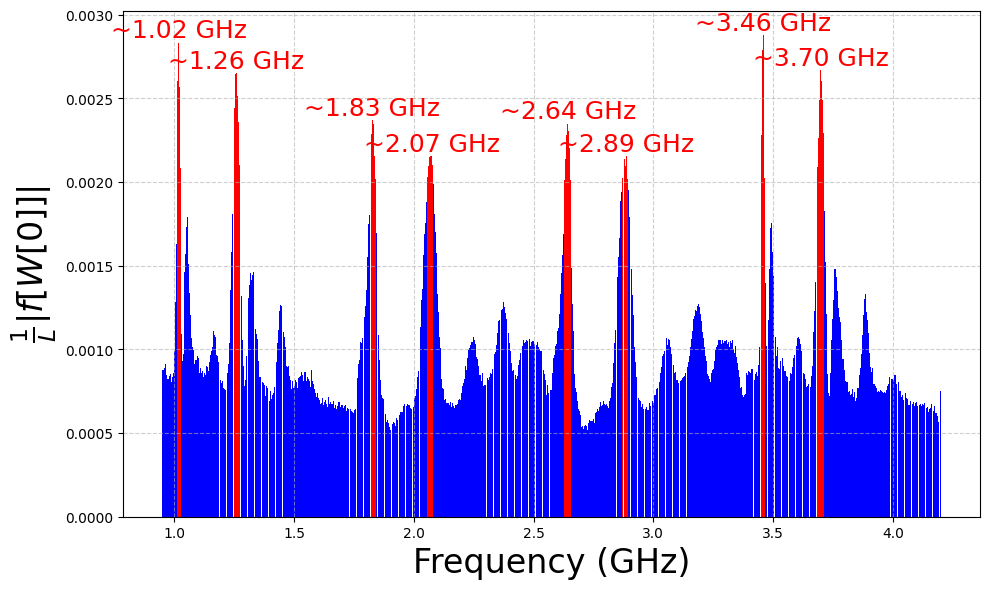

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

# Assuming best_model is already loaded and has been trained

# Get the weights of the first dense layer
weights = best_model.layers[0].get_weights()[0]  # Shape: (4004, number_of_neurons_in_first_layer)

# Calculate the importance of each input feature (summing absolute values across neurons)
feature_importance = np.sum(np.abs(weights), axis=1)  # Shape: (4004,)

# Initialize an array to store the aggregated feature importance for each frequency
aggregated_importance = np.zeros(1001)

# Sum each set of 4 weights to the corresponding frequency
for i in range(1001):
    aggregated_importance[i] = np.sum(feature_importance[4*i : 4*(i+1)])

# Normalize the aggregated importance
aggregated_importance = aggregated_importance / np.sum(aggregated_importance)

# Create the frequency array
frequencies = np.linspace(0.95, 4.2, 1001)

# Set a threshold for highlighting
threshold = 0.002  # Adjust this value as needed

# Identify frequencies with importance above the threshold
above_threshold = aggregated_importance > threshold

# Plot the feature importance against frequency
plt.figure(figsize=(10, 6))

# Plot bars below the threshold in one color (e.g., blue)
plt.bar(frequencies[~above_threshold], aggregated_importance[~above_threshold],
        width=0.003, color='blue', label='Below Threshold')

# Plot bars above the threshold in a different color (e.g., red) and highlight them
plt.bar(frequencies[above_threshold], aggregated_importance[above_threshold],
        width=0.003, color='red', label='Above Threshold')

# prev_freq = 0.95
# # Highlight the frequencies where the importance is above the threshold
# for freq, importance in zip(frequencies[above_threshold], aggregated_importance[above_threshold]):
#     if np.abs(prev_freq - freq) > 0.05:
#       if prev_freq > freq:
#         plt.text(freq, importance, f'~{freq:.2f} GHz', ha='right', va='bottom', fontsize=14, color='red')
#         prev_freq = freq

sorted_indices = np.argsort(frequencies[above_threshold])
sorted_frequencies = frequencies[above_threshold][sorted_indices]
sorted_importance = aggregated_importance[above_threshold][sorted_indices]

# Define the minimum frequency difference to consider two frequencies as "nearby"
min_freq_diff = 0.05

# Iterate over sorted frequencies and place text only on the highest importance frequency in each nearby group
i = 0
while i < len(sorted_frequencies):
    # Start of the group
    group_start = i
    # Group all nearby frequencies
    while (i + 1 < len(sorted_frequencies)) and (sorted_frequencies[i + 1] - sorted_frequencies[i] < min_freq_diff):
        i += 1
    # Determine the highest importance in the group
    group_end = i
    max_importance_idx = np.argmax(sorted_importance[group_start:group_end + 1]) + group_start
    plt.text(sorted_frequencies[max_importance_idx], sorted_importance[max_importance_idx],
             f'~{sorted_frequencies[max_importance_idx]:.2f} GHz',
             ha='center', va='bottom', fontsize=18, color='red')
    # Move to the next frequency group
    i += 1

# Add labels and title
plt.xlabel('Frequency (GHz)', fontsize = 24)
plt.ylabel(r'$\frac{1}{L}|f[W[0]]|$', fontsize = 24)
# plt.title('Aggregated Feature Importance Based on Weights vs Frequency')
# plt.legend()
plt.grid(True, linestyle='--', alpha=0.6)
plt.tight_layout()
plt.savefig('feature_imp.jpg')
plt.show()

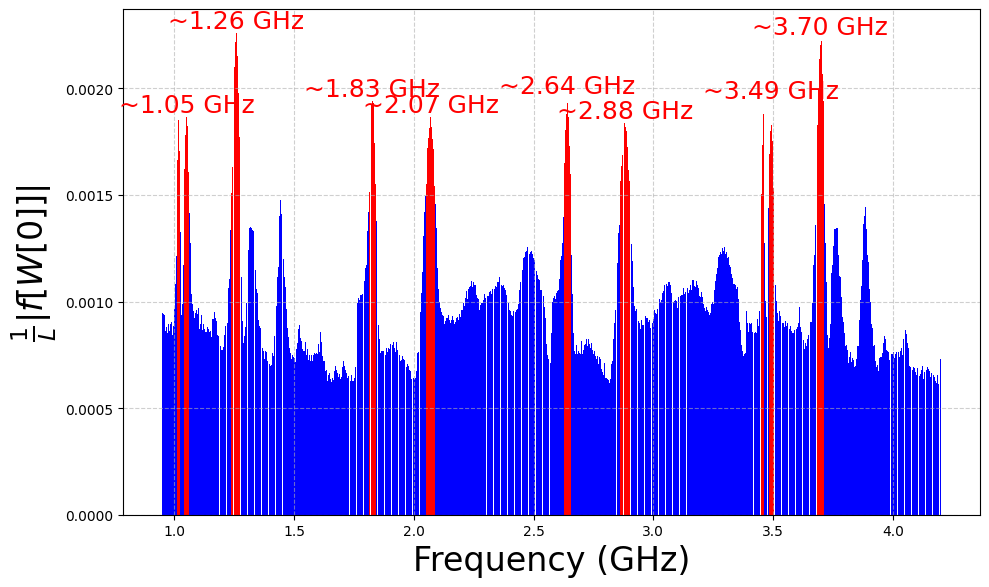

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

# Assuming best_model is already loaded and has been trained

# Get the weights of the first dense layer
weights = best_model.layers[0].get_weights()[0]  # Shape: (4004, number_of_neurons_in_first_layer)

# Calculate the importance of each input feature (summing absolute values across neurons)
feature_importance = np.sum(np.abs(weights), axis=1)  # Shape: (4004,)

# Initialize an array to store the aggregated feature importance for each frequency
aggregated_importance = np.zeros(1001)

# Sum each set of 4 weights to the corresponding frequency
for i in range(1001):
    aggregated_importance[i] = np.sum(feature_importance[4*i : 4*(i+1)])

# Normalize the aggregated importance
aggregated_importance = aggregated_importance / np.sum(aggregated_importance)

# Create the frequency array
frequencies = np.linspace(0.95, 4.2, 1001)

# Set a threshold for highlighting
threshold = 0.0015  # Adjust this value as needed

# Identify frequencies with importance above the threshold
above_threshold = aggregated_importance > threshold

# Plot the feature importance against frequency
plt.figure(figsize=(10, 6))

# Plot bars below the threshold in one color (e.g., blue)
plt.bar(frequencies[~above_threshold], aggregated_importance[~above_threshold],
        width=0.003, color='blue', label='Below Threshold')

# Plot bars above the threshold in a different color (e.g., red) and highlight them
plt.bar(frequencies[above_threshold], aggregated_importance[above_threshold],
        width=0.003, color='red', label='Above Threshold')

# prev_freq = 0.95
# # Highlight the frequencies where the importance is above the threshold
# for freq, importance in zip(frequencies[above_threshold], aggregated_importance[above_threshold]):
#     if np.abs(prev_freq - freq) > 0.05:
#       if prev_freq > freq:
#         plt.text(freq, importance, f'~{freq:.2f} GHz', ha='right', va='bottom', fontsize=14, color='red')
#         prev_freq = freq

sorted_indices = np.argsort(frequencies[above_threshold])
sorted_frequencies = frequencies[above_threshold][sorted_indices]
sorted_importance = aggregated_importance[above_threshold][sorted_indices]

# Define the minimum frequency difference to consider two frequencies as "nearby"
min_freq_diff = 0.05

# Iterate over sorted frequencies and place text only on the highest importance frequency in each nearby group
i = 0
while i < len(sorted_frequencies):
    # Start of the group
    group_start = i
    # Group all nearby frequencies
    while (i + 1 < len(sorted_frequencies)) and (sorted_frequencies[i + 1] - sorted_frequencies[i] < min_freq_diff):
        i += 1
    # Determine the highest importance in the group
    group_end = i
    max_importance_idx = np.argmax(sorted_importance[group_start:group_end + 1]) + group_start
    plt.text(sorted_frequencies[max_importance_idx], sorted_importance[max_importance_idx],
             f'~{sorted_frequencies[max_importance_idx]:.2f} GHz',
             ha='center', va='bottom', fontsize=18, color='red')
    # Move to the next frequency group
    i += 1

# Add labels and title
plt.xlabel('Frequency (GHz)', fontsize = 24)
plt.ylabel(r'$\frac{1}{L}|f[W[0]]|$', fontsize = 24)
# plt.title('Aggregated Feature Importance Based on Weights vs Frequency')
# plt.legend()
plt.grid(True, linestyle='--', alpha=0.6)
plt.tight_layout()
plt.savefig('feature_imp.jpg', dpi = 300)
plt.show()

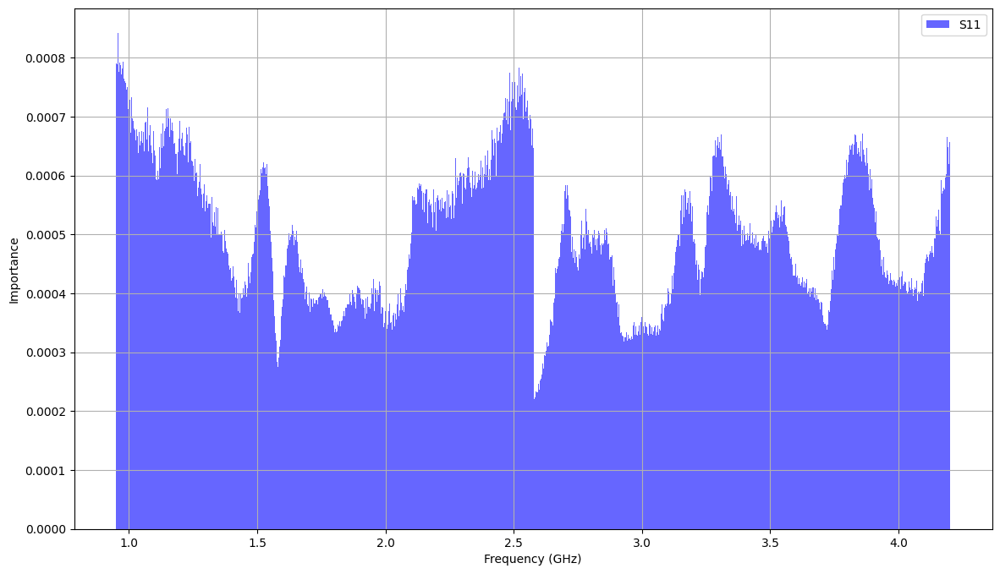

In [ ]:
s11 = feature_importance[0::2]
s21 = feature_importance[1::2]

frequencies = np.linspace(0.95, 4.2, 1001)

plt.figure(figsize=(14, 8))

plt.bar(frequencies, s11, width=(frequencies[1] - frequencies[0]), color='b', alpha=0.6, label='S11')
# plt.bar(frequencies, s21, width=(frequencies[1] - frequencies[0]), color='r', alpha=0.6, label='S21')

plt.xlabel('Frequency (GHz)')
plt.ylabel('Importance')
plt.legend()
plt.grid(True)
plt.show()

In [ ]:
indices_above_threshold = np.where(feature_importance > 0.0002)[0]
indices_above_threshold

array([  88,   89,   90,   91,   92,   93,   94,   95,   96,   97,   98,
         99,  100,  101,  102,  103,  104,  105,  106,  107,  108,  372,
        373,  374,  375,  376,  377,  378,  379,  380,  381,  382,  383,
        384,  385,  386,  387,  388,  389,  390,  391,  392,  393,  394,
        395,  396,  397,  398,  399,  400,  401,  402,  404, 1376, 1377,
       1378, 1379, 1380, 1381, 1382, 1383, 1384, 1385, 1386, 1387, 1388,
       1389, 1390, 1391, 1392, 1393, 1394, 1395, 1396, 1397, 1398, 1399,
       1400, 1401, 1402, 1403, 1404, 1405, 1406, 1407, 1408, 1409, 1410,
       1411, 1412, 1413, 1414, 1415, 1416, 1417, 1418, 1419, 1420, 1421,
       1422, 1423, 1424, 1425, 1426, 1427, 1428, 1429, 1683, 1822, 1823,
       1824, 1825, 1826, 1827, 1828, 1829, 1830, 2377, 2378, 2379, 2380,
       2381, 2382, 2383, 2384, 2385, 2386, 2387, 2388, 2389, 2390, 2391,
       2392, 2393, 2394, 2395, 2396, 2397, 2398, 2399, 2400, 2401, 2402,
       2403, 2404, 2405, 2406, 2407, 2408, 2409, 24

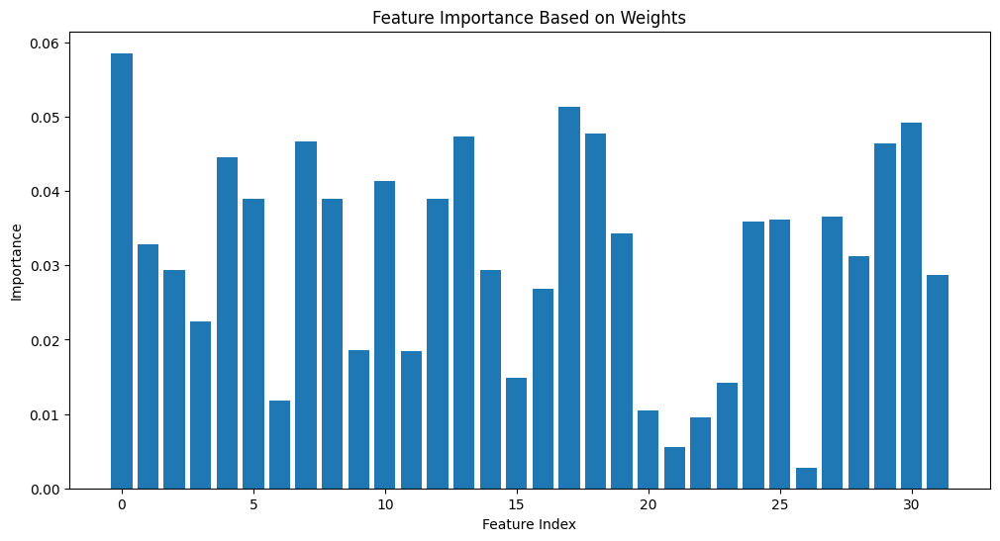

In [ ]:
weights = best_model.layers[4].get_weights()[0]  # Get weights of the first dense layer

# Calculate the importance of each input feature
feature_importance = np.sum(np.abs(weights), axis=1) #

# Normalize to get relative importance
feature_importance = feature_importance / np.sum(feature_importance)

# Plot feature importance
plt.figure(figsize=(12, 6))
plt.bar(range(len(feature_importance)), feature_importance)
plt.xlabel('Feature Index')
plt.ylabel('Importance')
plt.title('Feature Importance Based on Weights')
plt.show()

In [ ]:
from sklearn.metrics import mean_squared_error

def permutation_feature_importance(model, X, y, metric=mean_squared_error):
    baseline_score = metric(y, model.predict(X))
    importances = []

    for i in range(X.shape[1]):
        X_permuted = X.copy()
        np.random.shuffle(X_permuted[:, i])
        permuted_score = metric(y, model.predict(X_permuted))
        importances.append(baseline_score - permuted_score)

    return np.array(importances)

# Calculate importances
importances = permutation_feature_importance(best_model, X_test, y_test)

2/2 [==============================] - 0s 7ms/step


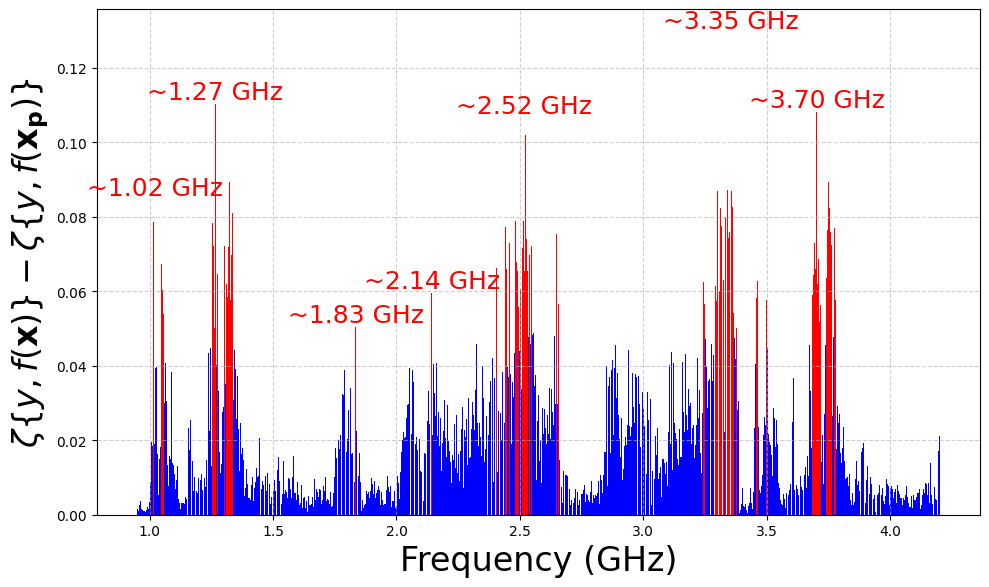

In [ ]:
# Initialize an array to store the aggregated feature importance for each frequency
aggregated_importance_per = np.zeros(1001)

# Sum each set of 4 weights to the corresponding frequency
for i in range(1001):
    aggregated_importance_per[i] = np.sum(np.abs(importances[4*i : 4*(i+1)]))

# Normalize the aggregated importance
# aggregated_importance_per = aggregated_importance_per / np.sum(aggregated_importance)

np.savetxt('./aggregated_importance_per.csv', aggregated_importance_per, delimiter=",")

# Create the frequency array
frequencies = np.linspace(0.95, 4.2, 1001)

# Set a threshold for highlighting
threshold = 0.05  # Adjust this value as needed

# Identify frequencies with importance above the threshold
above_threshold = aggregated_importance_per > threshold

# Plot the feature importance against frequency
plt.figure(figsize=(10, 6))

# Plot bars below the threshold in one color (e.g., blue)
plt.bar(frequencies[~above_threshold], aggregated_importance_per[~above_threshold],
        width=0.003, color='blue', label='Below Threshold')

# Plot bars above the threshold in a different color (e.g., red) and highlight them
plt.bar(frequencies[above_threshold], aggregated_importance_per[above_threshold],
        width=0.003, color='red', label='Above Threshold')

sorted_indices = np.argsort(frequencies[above_threshold])
sorted_frequencies = frequencies[above_threshold][sorted_indices]
sorted_importance_per = aggregated_importance_per[above_threshold][sorted_indices]

# Define the minimum frequency difference to consider two frequencies as "nearby"
min_freq_diff = 0.15

# Vertical offset for placing the text
vertical_offset = 0.0 * max(sorted_importance_per)  # Adjust based on importance scale

# Iterate over sorted frequencies and place text only on the highest importance frequency in each nearby group
i = 0
while i < len(sorted_frequencies):
    # Start of the group
    group_start = i
    # Group all nearby frequencies
    while (i + 1 < len(sorted_frequencies)) and (sorted_frequencies[i + 1] - sorted_frequencies[i] < min_freq_diff):
        i += 1
    # Determine the highest importance in the group
    group_end = i
    max_importance_idx = np.argmax(sorted_importance_per[group_start:group_end + 1]) + group_start

    # Position the text with an offset to avoid overlapping
    text_y_position = sorted_importance_per[max_importance_idx] + vertical_offset

    # Clamp text to ensure it doesn't go too far above the plot
    text_y_position = min(text_y_position, max(sorted_importance_per) * 1.1)

    plt.text(sorted_frequencies[max_importance_idx], text_y_position,
             f'~{sorted_frequencies[max_importance_idx]:.2f} GHz',
             ha='center', va='bottom', fontsize=18, color='red')
    # Move to the next frequency group
    i += 1

# Add labels and title
plt.xlabel('Frequency (GHz)', fontsize=24)
plt.ylabel(r'$\zeta\{y,f(\mathbf{x})\}-\zeta\{y,f(\mathbf{x_p})\}$', fontsize=24)
plt.grid(True, linestyle='--', alpha=0.6)
plt.tight_layout()
plt.savefig('feature_imp_per.jpg', dpi = 300)
plt.show()

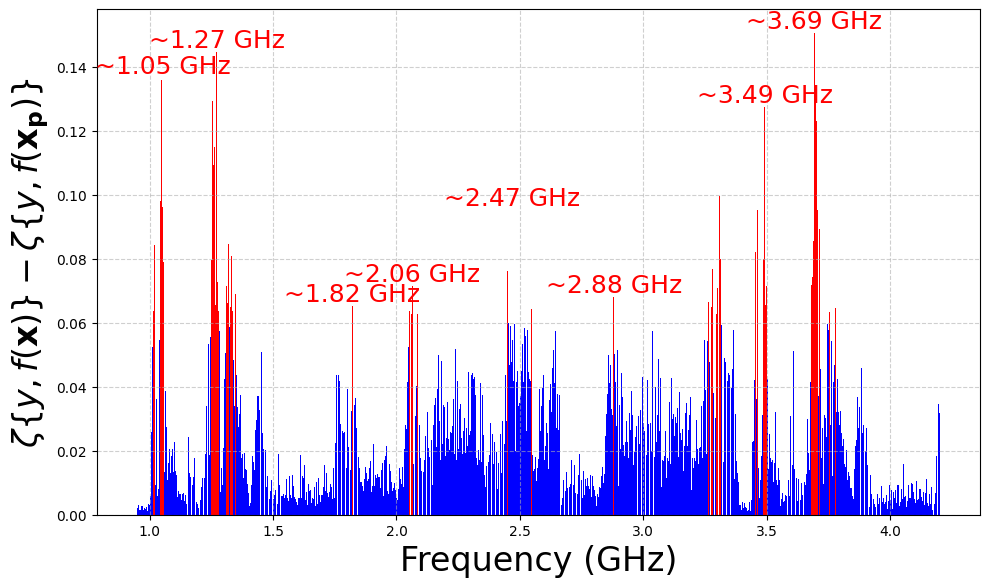

In [ ]:
# Initialize an array to store the aggregated feature importance for each frequency
aggregated_importance_per = np.zeros(1001)

# Sum each set of 4 weights to the corresponding frequency
for i in range(1001):
    aggregated_importance_per[i] = np.sum(np.abs(importances[4*i : 4*(i+1)]))

# Normalize the aggregated importance
# aggregated_importance_per = aggregated_importance_per / np.sum(aggregated_importance)

# Create the frequency array
frequencies = np.linspace(0.95, 4.2, 1001)

# Set a threshold for highlighting
threshold = 0.06  # Adjust this value as needed

# Identify frequencies with importance above the threshold
above_threshold = aggregated_importance_per > threshold

# Plot the feature importance against frequency
plt.figure(figsize=(10, 6))

# Plot bars below the threshold in one color (e.g., blue)
plt.bar(frequencies[~above_threshold], aggregated_importance_per[~above_threshold],
        width=0.003, color='blue', label='Below Threshold')

# Plot bars above the threshold in a different color (e.g., red) and highlight them
plt.bar(frequencies[above_threshold], aggregated_importance_per[above_threshold],
        width=0.003, color='red', label='Above Threshold')

sorted_indices = np.argsort(frequencies[above_threshold])
sorted_frequencies = frequencies[above_threshold][sorted_indices]
sorted_importance_per = aggregated_importance_per[above_threshold][sorted_indices]

# Define the minimum frequency difference to consider two frequencies as "nearby"
min_freq_diff = 0.15

# Vertical offset for placing the text
vertical_offset = 0.0 * max(sorted_importance_per)  # Adjust based on importance scale

# Iterate over sorted frequencies and place text only on the highest importance frequency in each nearby group
i = 0
while i < len(sorted_frequencies):
    # Start of the group
    group_start = i
    # Group all nearby frequencies
    while (i + 1 < len(sorted_frequencies)) and (sorted_frequencies[i + 1] - sorted_frequencies[i] < min_freq_diff):
        i += 1
    # Determine the highest importance in the group
    group_end = i
    max_importance_idx = np.argmax(sorted_importance_per[group_start:group_end + 1]) + group_start

    # Position the text with an offset to avoid overlapping
    text_y_position = sorted_importance_per[max_importance_idx] + vertical_offset

    # Clamp text to ensure it doesn't go too far above the plot
    text_y_position = min(text_y_position, max(sorted_importance_per) * 1.1)

    plt.text(sorted_frequencies[max_importance_idx], text_y_position,
             f'~{sorted_frequencies[max_importance_idx]:.2f} GHz',
             ha='center', va='bottom', fontsize=18, color='red')
    # Move to the next frequency group
    i += 1

# Add labels and title
plt.xlabel('Frequency (GHz)', fontsize=24)
plt.ylabel(r'$\zeta\{y,f(\mathbf{x})\}-\zeta\{y,f(\mathbf{x_p})\}$', fontsize=24)
plt.grid(True, linestyle='--', alpha=0.6)
plt.tight_layout()
plt.savefig('feature_imp_per.jpg', dpi = 300)
plt.show()

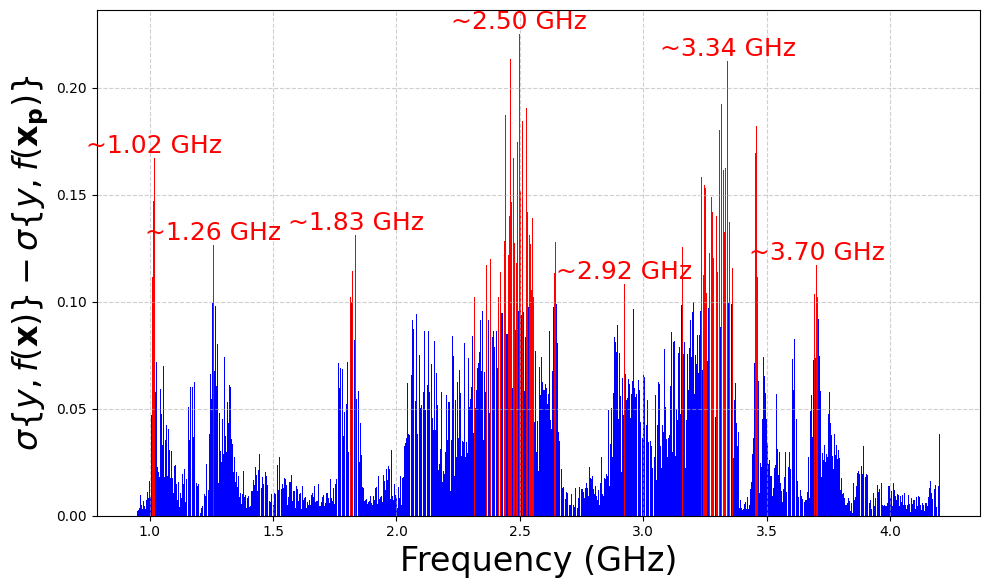

In [ ]:
# Initialize an array to store the aggregated feature importance for each frequency
aggregated_importance_per = np.zeros(1001)

# Sum each set of 4 weights to the corresponding frequency
for i in range(1001):
    aggregated_importance_per[i] = np.sum(np.abs(importances[4*i : 4*(i+1)]))

# Normalize the aggregated importance
# aggregated_importance_per = aggregated_importance_per / np.sum(aggregated_importance)

# Create the frequency array
frequencies = np.linspace(0.95, 4.2, 1001)

# Set a threshold for highlighting
threshold = 0.1  # Adjust this value as needed

# Identify frequencies with importance above the threshold
above_threshold = aggregated_importance_per > threshold

# Plot the feature importance against frequency
plt.figure(figsize=(10, 6))

# Plot bars below the threshold in one color (e.g., blue)
plt.bar(frequencies[~above_threshold], aggregated_importance_per[~above_threshold],
        width=0.003, color='blue', label='Below Threshold')

# Plot bars above the threshold in a different color (e.g., red) and highlight them
plt.bar(frequencies[above_threshold], aggregated_importance_per[above_threshold],
        width=0.003, color='red', label='Above Threshold')

# prev_freq = 0.95
# # Highlight the frequencies where the importance is above the threshold
# for freq, importance in zip(frequencies[above_threshold], aggregated_importance[above_threshold]):
#     if np.abs(prev_freq - freq) > 0.05:
#       if prev_freq > freq:
#         plt.text(freq, importance, f'~{freq:.2f} GHz', ha='right', va='bottom', fontsize=14, color='red')
#         prev_freq = freq

sorted_indices = np.argsort(frequencies[above_threshold])
sorted_frequencies = frequencies[above_threshold][sorted_indices]
sorted_importance_per = aggregated_importance_per[above_threshold][sorted_indices]

# Define the minimum frequency difference to consider two frequencies as "nearby"
min_freq_diff = 0.1

# Iterate over sorted frequencies and place text only on the highest importance frequency in each nearby group
i = 0
while i < len(sorted_frequencies):
    # Start of the group
    group_start = i
    # Group all nearby frequencies
    while (i + 1 < len(sorted_frequencies)) and (sorted_frequencies[i + 1] - sorted_frequencies[i] < min_freq_diff):
        i += 1
    # Determine the highest importance in the group
    group_end = i
    max_importance_idx = np.argmax(sorted_importance_per[group_start:group_end + 1]) + group_start
    plt.text(sorted_frequencies[max_importance_idx], sorted_importance_per[max_importance_idx],
             f'~{sorted_frequencies[max_importance_idx]:.2f} GHz',
             ha='center', va='bottom', fontsize=18, color='red')
    # Move to the next frequency group
    i += 1

# Add labels and title
plt.xlabel('Frequency (GHz)', fontsize = 24)
plt.ylabel(r'$\zeta\{y,f(\mathbf{x})\}-\zeta\{y,f(\mathbf{x_p})\}$', fontsize = 24)
# plt.title('Aggregated Feature Importance Based on Weights vs Frequency')
# plt.legend()
plt.grid(True, linestyle='--', alpha=0.6)
plt.tight_layout()
plt.savefig('feature_imp_per.jpg')
plt.show()

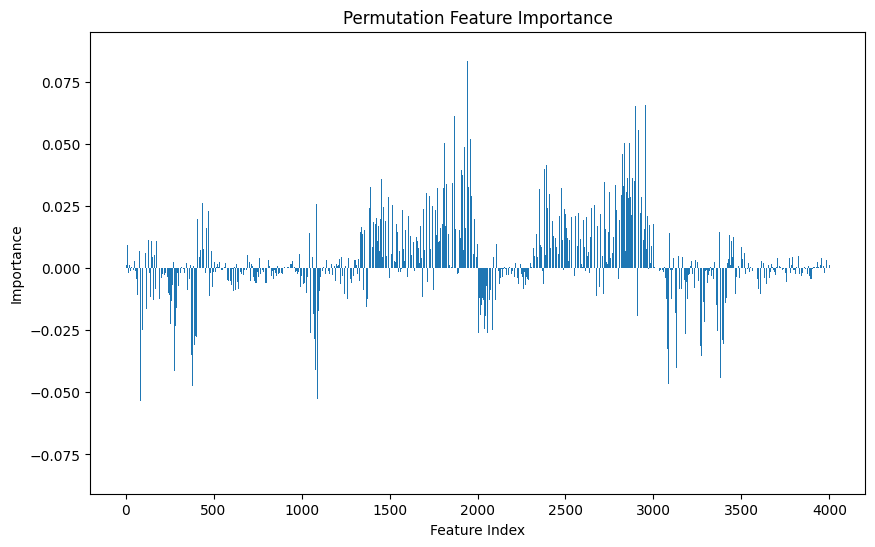

In [ ]:
# Plot feature importance
plt.figure(figsize=(10, 6))
plt.bar(range(len(importances)), importances)
plt.xlabel('Feature Index')
plt.ylabel('Importance')
plt.title('Permutation Feature Importance')
plt.show()

# Complex-valued network

In [42]:
def normalize_complex_arr(a):
    a_oo = a - a.real.min() - 1j*a.imag.min() # origin offsetted
    print(a.real.min(), a.imag.min(), np.abs(a_oo).max())
    return a_oo/np.abs(a_oo).max()

X_normalized_complex = normalize_complex_arr(X)

-0.9736976248991317 -0.9694072367583004 2.316179880336761


In [53]:
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(X_normalized_complex, y, test_size=0.25, random_state=42)

In [54]:
type(X_train[0][0])

numpy.complex128

In [21]:
!pip install cvnn

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 59.9/59.9 kB 4.0 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for cvnn: filename=cvnn-2.0-py2.py3-none-any.whl size=47609 sha256=0f3909ed02ef9691eaad725648ed2ef4a7d8bb9c206992a7c575081ff48dea33
  Stored in directory: /root/.cache/pip/wheels/91/7c/d5/a4816f12ef5f955ed83cd22822d376f57aa0bc00b7ea2c4486
Successfully built cvnn


In [22]:
!pip install tensorflow-probability==0.23.0

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 6.9/6.9 MB 56.3 MB/s eta 0:00:00
  Attempting uninstall: tensorflow-probability
    Found existing installation: tensorflow-probability 0.24.0
    Uninstalling tensorflow-probability-0.24.0:
      Successfully uninstalled tensorflow-probability-0.24.0


In [23]:
import numpy as np
import cvnn.layers as complex_layers
import tensorflow as tf
# import cvnn

In [24]:
import tensorflow as tf
from tensorflow.keras.layers import Layer

class ComplexToReal(Layer):
    def __init__(self):
        super(ComplexToReal, self).__init__()

    def call(self, inputs):
        real = tf.math.real(inputs)  # Extract real part
        imag = tf.math.imag(inputs)  # Extract imaginary part

        output = tf.concat([real, imag], axis=-1)

        return output

In [25]:
mse_list_eps = []
mae_list_eps = []
mean_percentage_error_list_eps = []
r2_list_eps = []
pearson_list_eps = []
spearman_list_eps = []

mse_list_tau = []
mae_list_tau = []
mean_percentage_error_list_tau = []
r2_list_tau = []
pearson_list_tau = []
spearman_list_tau = []

experiment_count = 0

In [30]:
def learning_rate_schedule(epoch, initial_lr=0.001):
    """
    Custom learning rate schedule. Adjust the learning rate based on the current epoch.
    You can customize this function to fit your needs.
    """
    if epoch < 300 or epoch == 300:
        return initial_lr  # Keep the initial learning rate for the first 50 epochs
    elif epoch > 300 and epoch%100 == 0:
        initial_lr = initial_lr * 0.5  # Reduce the learning rate by a factor of 10 after epoch 50
        return initial_lr
    else:
        return initial_lr

# Create the Adam optimizer with the initial learning rate
initial_learning_rate = 0.001
adam_optimizer = Adam(learning_rate=initial_learning_rate)

lr_scheduler = LearningRateScheduler(learning_rate_schedule)

In [31]:
model_complex = tf.keras.models.Sequential()
model_complex.add(complex_layers.ComplexInput(input_shape=(4004,), dtype = tf.complex64)) #4004
#model_complex.add(complex_layers.ComplexFlatten())
# model_complex.add(complex_layers.ComplexDense(units=64, activation='cart_leaky_relu', dtype = tf.complex64))
# model_complex.add(complex_layers.ComplexDense(units=128, activation='cart_leaky_relu', dtype = tf.complex64))
model_complex.add(complex_layers.ComplexDense(units=512, activation='cart_selu'))
model_complex.add(complex_layers.ComplexDense(units=256, activation='cart_selu'))
model_complex.add(complex_layers.ComplexDense(units=128, activation='cart_selu'))
model_complex.add(complex_layers.ComplexDense(units=256, activation='cart_selu'))
model_complex.add(complex_layers.ComplexDense(units=512, activation='cart_selu'))
# model_complex.add(complex_layers.ComplexDense(units=32, activation='cart_leaky_relu'))
# model_complex.add(Dense(units=3, activation='linear'))
model_complex.add(complex_layers.ComplexDense(128, activation='convert_to_real_with_abs'))
model_complex.add(Dense(units=2, activation='linear'))
model_complex.compile(loss='mean_squared_error', optimizer=adam_optimizer, metrics=[tf.keras.metrics.MeanSquaredError(dtype=tf.complex64)])

In [32]:
model_complex.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 complex_dense_6 (ComplexDe  (None, 512)               1643520   
 nse)                                                            
                                                                 
 complex_dense_7 (ComplexDe  (None, 256)               262656    
 nse)                                                            
                                                                 
 complex_dense_8 (ComplexDe  (None, 128)               65792     
 nse)                                                            
                                                                 
 complex_dense_9 (ComplexDe  (None, 256)               66048     
 nse)                                                            
                                                                 
 complex_dense_10 (ComplexD  (None, 512)              

In [33]:
from tensorflow.keras.callbacks import ModelCheckpoint, Callback

class StopAtValLossThreshold(Callback):
    def __init__(self, threshold):
        super(StopAtValLossThreshold, self).__init__()
        self.threshold = threshold

    def on_epoch_end(self, epoch, logs=None):
        val_loss = logs.get('val_loss')
        if val_loss is not None and val_loss <= self.threshold:
            print(f"\nStopping training as val_loss has reached the threshold: {val_loss:.4f} <= {self.threshold:.4f}")
            self.model.stop_training = True

# Define your threshold for early stopping
threshold_val_loss = 2.1

# Custom callback to stop training when val_loss falls below the threshold
stop_at_threshold = StopAtValLossThreshold(threshold=threshold_val_loss)

checkpoint_complex = ModelCheckpoint('best_model_complex.h5', monitor='val_loss', save_best_only=True, verbose=1)

model_complex.fit(X_train, y_train, epochs=epochs+500, batch_size=batch_size, validation_data=(X_test, y_test), callbacks=[checkpoint_complex, stop_at_threshold, lr_scheduler])

loss_complex = model_complex.evaluate(X_test, y_test)
print("Test Loss:", loss_complex)

Epoch 1/1000
7/7 [==============================] - ETA: 0s - loss: 621.7143 - mean_squared_error: 621.7142+0.0000j
Epoch 1: val_loss improved from inf to 198.56206, saving model to best_model_complex.h5
7/7 [==============================] - 6s 140ms/step - loss: 621.7143 - mean_squared_error: 621.7142+0.0000j - val_loss: 198.5621 - val_mean_squared_error: 198.5621+0.0000j - lr: 0.0010
Epoch 2/1000
7/7 [==============================] - ETA: 0s - loss: 344.1137 - mean_squared_error: 344.1137+0.0000j
Epoch 2: val_loss did not improve from 198.56206
7/7 [==============================] - 0s 67ms/step - loss: 344.1137 - mean_squared_error: 344.1137+0.0000j - val_loss: 433.6158 - val_mean_squared_error: 433.6158+0.0000j - lr: 0.0010
Epoch 3/1000
6/7 [========================>.....] - ETA: 0s - loss: 195.6183 - mean_squared_error: 195.6183+0.0000j
Epoch 3: val_loss improved from 198.56206 to 147.64566, saving model to best_model_complex.h5
7/7 [==============================] - 1s 89ms/ste

In [34]:
preds = model_complex.predict(X_test)

errors_complex = np.abs(preds - y_test)

2/2 [==============================] - 0s 15ms/step


In [ ]:
from sklearn.metrics import mean_absolute_error, r2_score, mean_squared_error

for i in range(preds.shape[1]):

    if y_test.ndim < 2:
      y_test = np.expand_dims(y_test, axis=1)

    mse = mean_squared_error(y_test[:, i], preds[:, i])

    # Mean Absolute Error
    mae = mean_absolute_error(y_test[:, i], preds[:, i])

    # Mean Percentage Error
    mean_percentage_error = np.mean(np.abs((y_test[:, i] - preds[:, i]) / (y_test[:, i]))) * 100

    # Coefficient of Determination (R²)
    r2 = r2_score(y_test[:, i], preds[:, i])

    if i%2==0:
      mse_list_eps.append(mse)
      mae_list_eps.append(mae)
      mean_percentage_error_list_eps.append(mean_percentage_error)
      r2_list_eps.append(r2)
    else:
      mse_list_tau.append(mse)
      mae_list_tau.append(mae)
      mean_percentage_error_list_tau.append(mean_percentage_error)
      r2_list_tau.append(r2)

In [ ]:
import numpy as np
from scipy.stats import pearsonr, spearmanr, kendalltau

if preds.shape[1] == 1:
  pearson_corr, _ = pearsonr(y_test.flatten(), preds.flatten())         # [:, i] Pearson correlation coefficient
  spearman_corr, _ = spearmanr(y_test.flatten(), preds.flatten())       # Spearman rank correlation coefficient
  kendall_corr, _ = kendalltau(y_test.flatten(), preds.flatten())

  print(f"pearson: {pearson_corr}, spearman: {spearman_corr}, kendall: {kendall_corr}")

  pearson_list_eps.append(pearson_corr)
  spearman_list_eps.append(spearman_corr)

else:
  for i in range(preds.shape[1]):
    # Calculate different correlation coefficients
    pearson_corr, _ = pearsonr(y_test[:, i].flatten(), preds[:, i].flatten())         # [:, i] Pearson correlation coefficient
    spearman_corr, _ = spearmanr(y_test[:, i].flatten(), preds[:, i].flatten())       # Spearman rank correlation coefficient
    kendall_corr, _ = kendalltau(y_test[:, i].flatten(), preds[:, i].flatten())

    print(f"pearson: {pearson_corr}, spearman: {spearman_corr}, kendall: {kendall_corr}")

    if i%2==0:
      pearson_list_eps.append(pearson_corr)
      spearman_list_eps.append(spearman_corr)

    else:
      pearson_list_tau.append(pearson_corr)
      spearman_list_tau.append(spearman_corr)

experiment_count += 1

pearson: 0.9916334060875509, spearman: 0.9769151434154268, kendall: 0.90378524920569
pearson: 0.9606950340818547, spearman: 0.9572434660996219, kendall: 0.8647671885400613


In [ ]:
print(experiment_count)
print(mae_list_eps)
print(np.mean(mse_list_eps), np.std(mse_list_eps), np.mean(mae_list_eps), np.std(mae_list_eps), np.mean(mean_percentage_error_list_eps), np.std(mean_percentage_error_list_eps),np.mean(r2_list_eps), np.std(r2_list_eps), np.mean(pearson_list_eps), np.std(pearson_list_eps), np.mean(spearman_list_eps), np.std(spearman_list_eps))
print(" ")
print(np.mean(mse_list_tau), np.std(mse_list_tau), np.mean(mae_list_tau), np.std(mae_list_tau), np.mean(mean_percentage_error_list_tau), np.std(mean_percentage_error_list_tau),np.mean(r2_list_tau), np.std(r2_list_tau), np.mean(pearson_list_tau), np.std(pearson_list_tau), np.mean(spearman_list_tau), np.std(spearman_list_tau))

5
[0.9418730864653716, 0.9935543214952623, 0.9295575940931166, 0.8860484844929463, 0.8860484844929463]
3.511791162177707 0.14133267231387972 0.9274163942079285 0.04002602658824193 7.256191772196717 0.26518401283870985 0.9877792524122488 0.0004918262033495183 0.9940955624765622 0.0002401763017335224 0.977884906555683 1.1102230246251565e-16
 
nan nan nan nan nan nan nan nan nan nan nan nan


/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3504: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:129: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:206: RuntimeWarning: Degrees of freedom <= 0 for slice
  ret = _var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:163: RuntimeWarning: invalid value encountered in divide
  arrmean = um.true_divide(arrmean, div, out=arrmean,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:198: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)


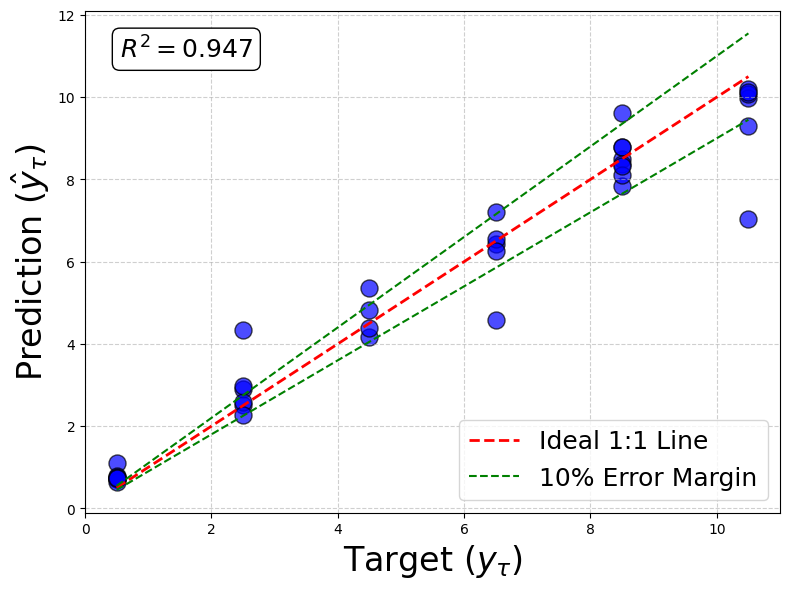

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import r2_score

if preds.shape[1] == 1 and y_test.ndim < 2:
  y_test = np.expand_dims(y_test, axis=1)

# Calculate the R^2 score
r2 = r2_score(y_test, preds)

# Create a scatter plot
plt.figure(figsize=(8, 6))
plt.scatter(y_test, preds, s=150, color='blue', alpha=0.7, edgecolors='k')

# Plotting a line of best fit
plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'r--', lw=2, label='Ideal 1:1 Line')

plt.plot([y_test.min(), y_test.max()], [y_test.min() * 0.9, y_test.max() * 0.9], 'g--', lw=1.5, label='10% Error Margin')
plt.plot([y_test.min(), y_test.max()], [y_test.min() * 1.1, y_test.max() * 1.1], 'g--', lw=1.5)

# Labeling the plot
# plt.title('Scatter Plot of Predictions vs Targets', fontsize=16)
plt.xlabel(r'Target ($y_{\tau}$)', fontsize=24)
plt.ylabel(r'Prediction ($\hat{y}_{\tau}$)', fontsize=24)

# Adding R^2 score as a text box in the plot
plt.text(0.05, 0.95, f'$R^2 = {r2:.3f}$', transform=plt.gca().transAxes,
         fontsize=18, verticalalignment='top', bbox=dict(boxstyle='round,pad=0.3', edgecolor='black', facecolor='white'))

# Fine-tune the plot's aesthetics
plt.grid(True, linestyle='--', alpha=0.6)
plt.legend(fontsize=18, loc = 'lower right')
plt.tight_layout()
plt.savefig('tau.jpg')

# Show the plot
plt.show()

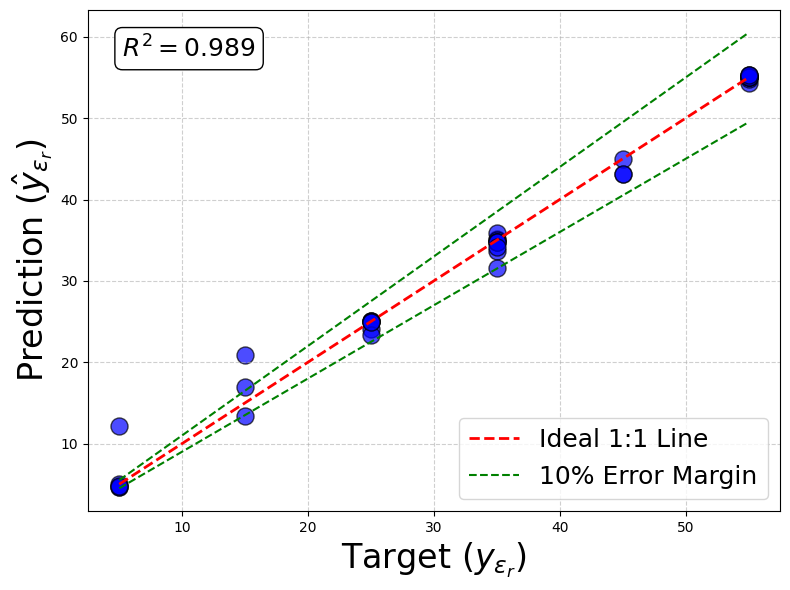

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import r2_score

if preds.shape[1] == 1 and y_test.ndim < 2:
  y_test = np.expand_dims(y_test, axis=1)

# Calculate the R^2 score
r2 = r2_score(y_test, preds)

# Create a scatter plot
plt.figure(figsize=(8, 6))
plt.scatter(y_test, preds, s=150, color='blue', alpha=0.7, edgecolors='k')

# Plotting a line of best fit
plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'r--', lw=2, label='Ideal 1:1 Line')

plt.plot([y_test.min(), y_test.max()], [y_test.min() * 0.9, y_test.max() * 0.9], 'g--', lw=1.5, label='10% Error Margin')
plt.plot([y_test.min(), y_test.max()], [y_test.min() * 1.1, y_test.max() * 1.1], 'g--', lw=1.5)

# Labeling the plot
# plt.title('Scatter Plot of Predictions vs Targets', fontsize=16)
plt.xlabel(r'Target ($y_{\epsilon_r}$)', fontsize=24)
plt.ylabel(r'Prediction ($\hat{y}_{\epsilon_r}$)', fontsize=24)

# Adding R^2 score as a text box in the plot
plt.text(0.05, 0.95, f'$R^2 = {r2:.3f}$', transform=plt.gca().transAxes,
         fontsize=18, verticalalignment='top', bbox=dict(boxstyle='round,pad=0.3', edgecolor='black', facecolor='white'))

# Fine-tune the plot's aesthetics
plt.grid(True, linestyle='--', alpha=0.6)
plt.legend(fontsize=18, loc = 'lower right')
plt.tight_layout()
plt.savefig('eps_relative.jpg')

# Show the plot
plt.show()

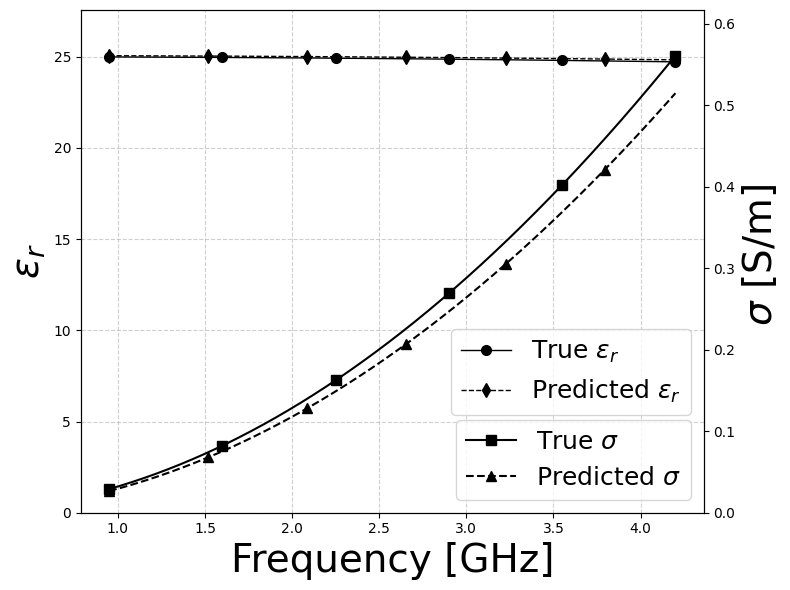

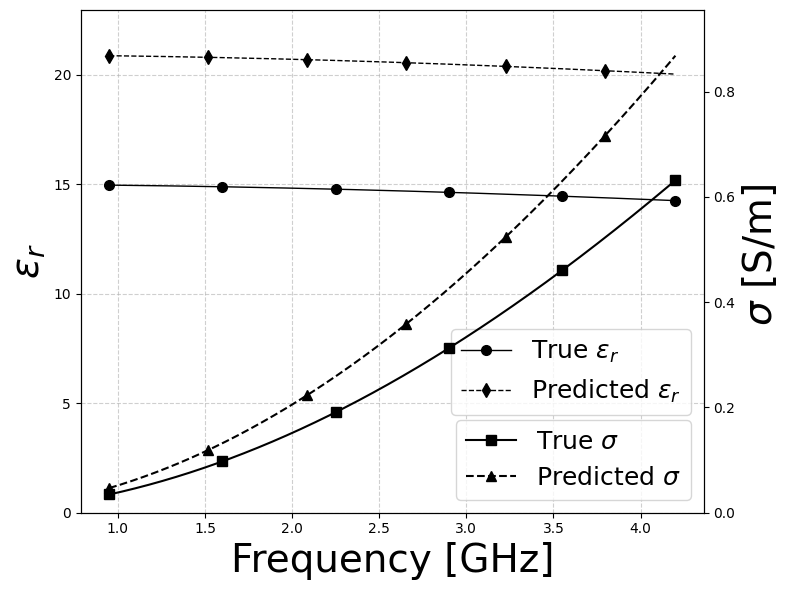

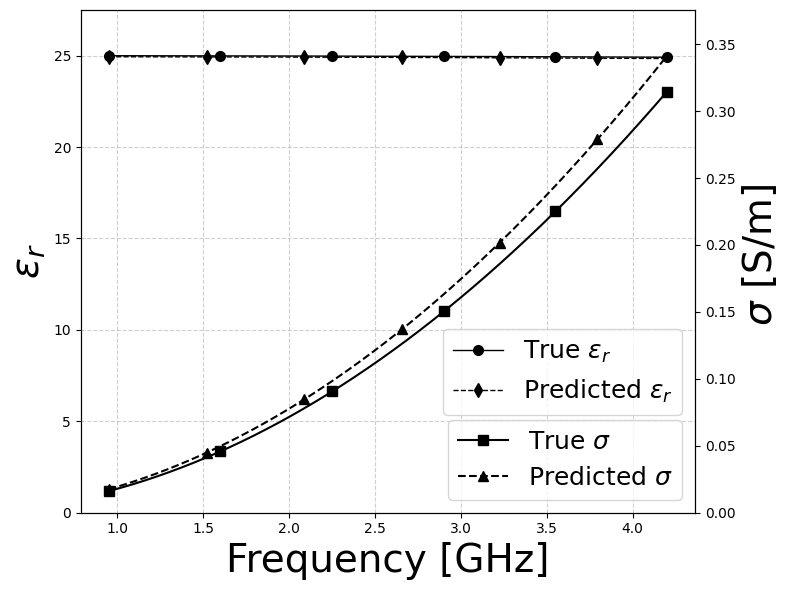

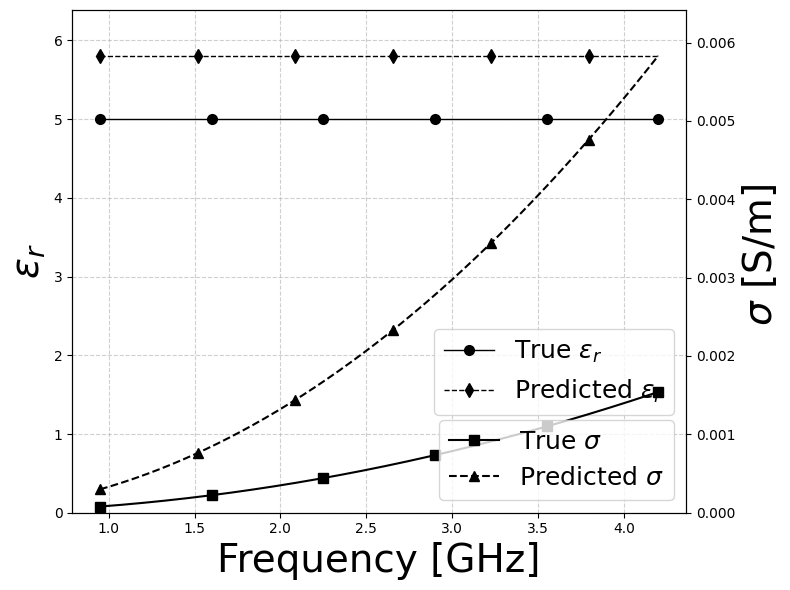

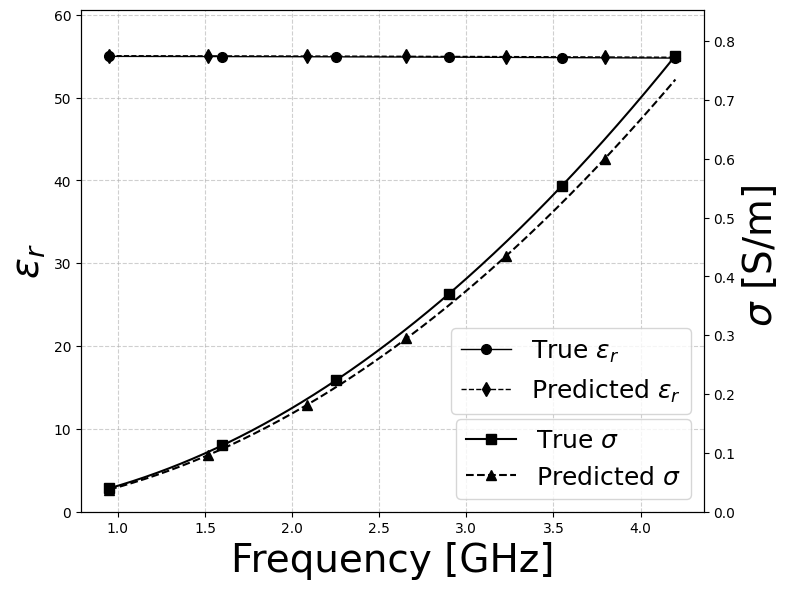

...

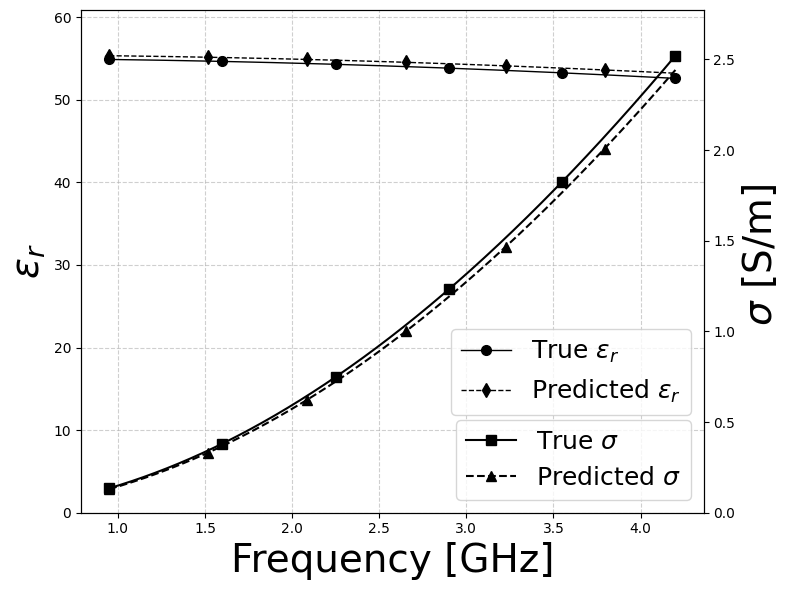

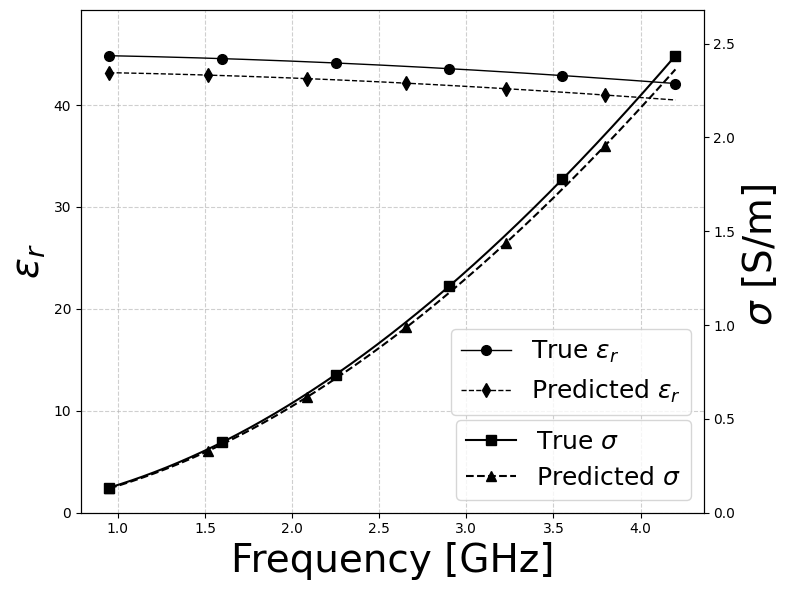

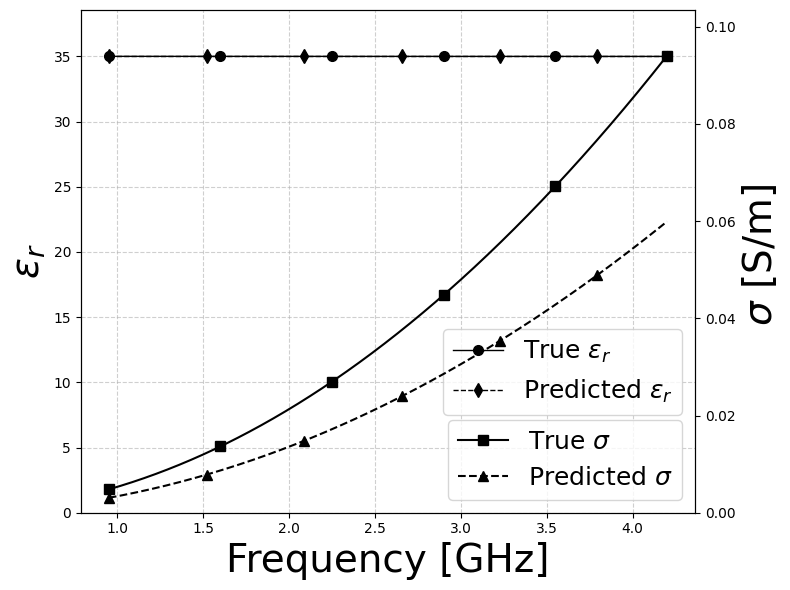

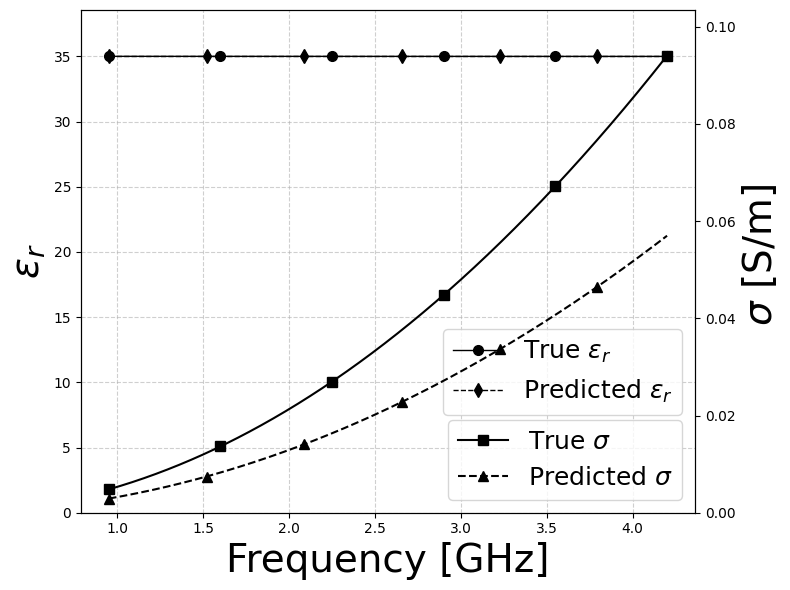

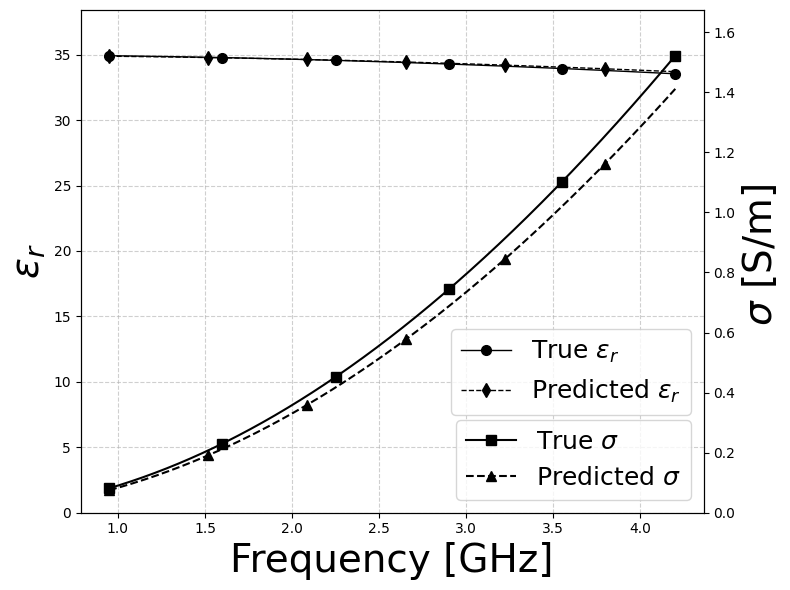

In [ ]:
import pandas as pd

for i in range(preds.shape[0]):

  # Define Debye parameters
  eps_inf_opt = 4.5 # y_test[i, 0] #preds[i, 0] #4.5
  eps_s_opt = preds[i, 0] #30
  tau_opt = preds[i, 1] #10

  eps_inf_real = 4.5 # y_test[i, 0] #4.5
  eps_s_real = y_test[i, 0]
  tau_real = y_test[i, 1]

  # Define frequency array (in GHz)
  freq = np.linspace(0.95, 4.2, 1001)  # Example frequency range from 0.1 GHz to 10 GHz

  # Calculate permittivity
  epsilon_1 = eps_inf_opt + (eps_s_opt - eps_inf_opt) / (1 + 1j * 2 * np.pi * freq * 1e9 * tau_opt * 1e-12)
  epsilon_real = eps_inf_real + (eps_s_real - eps_inf_real) / (1 + 1j * 2 * np.pi * freq * 1e9 * tau_real * 1e-12)

  eps_r_1 = np.real(epsilon_1)
  # print(type(eps_r_1))
  # eps_r_1.tofile(f'/content/test_results_csv/eps_pred_{i}.csv', sep = ',')
  np.savetxt(f'./test_results_csv/eps_pred_{i}.csv', eps_r_1, delimiter=",")
  pd.DataFrame(eps_r_1).to_excel(f'./test_results_xlx/eps_pred_{i}.xlsx', index=False)
  eps_i_1 = np.imag(epsilon_1)
  eps_r_real = np.real(epsilon_real)
  # print(type(eps_r_real))
  # eps_r_real.tofile(f'/content/test_results_csv/eps_real_{i}.csv', sep = ',')
  np.savetxt(f'./test_results_csv/eps_real_{i}.csv', eps_r_real, delimiter=",")
  pd.DataFrame(eps_r_real).to_excel(f'./test_results_xlx/eps_real_{i}.xlsx', index=False)
  eps_i_real = np.imag(epsilon_real)
  eps0 = 8.8541878128e-12

  # Calculate conductivity
  cond_1 = -eps_i_1 * 2 * np.pi * freq * 1e9 * eps0
  cond_real = -eps_i_real * 2 * np.pi * freq * 1e9 * eps0
  # cond_1.tofile(f'/content/test_results_csv/cond_pred_{i}.csv', sep = ',')
  # cond_real.tofile(f'/content/test_results_csv/cond_real_{i}.csv', sep = ',')
  # print(type(cond_1))
  # print(type(cond_real))
  np.savetxt(f'./test_results_csv/cond_pred_{i}.csv', cond_1, delimiter=",")
  np.savetxt(f'./test_results_csv/cond_real_{i}.csv', cond_real, delimiter=",")

  pd.DataFrame(cond_1).to_excel(f'./test_results_xlx/cond_1_{i}.xlsx', index=False)
  pd.DataFrame(cond_real).to_excel(f'./test_results_xlx/cond_real_{i}.xlsx', index=False)

    # Create a figure and axis
  fig, ax1 = plt.subplots(figsize=(8, 6))

  # Plot permittivity on the left y-axis with black color and markers
  ax1.plot(freq, eps_r_real, 'ko-', label='True $\epsilon_r$', linewidth = 1, markevery = 200, markersize=7)  # 'ko-' is black line with circle markers
  ax1.plot(freq, eps_r_1, 'kd--', label='Predicted $\epsilon_r$', linewidth = 1, markevery = 175, markersize=7)  # 'ks-' is black line with square markers
  ax1.set_xlabel('Frequency [GHz]', fontsize=28)
  ax1.set_ylabel('$\epsilon_r$', color='black', fontsize=28)
  ax1.tick_params(axis='y', labelcolor='black')
  ax1.legend(fontsize=18, loc='lower right', bbox_to_anchor=(1, 0.17))
  ax1.grid(True, linestyle='--', alpha=0.6)

  # Set y-limits for permittivity plot
  y_min = min(np.min(eps_r_1), np.min(eps_r_real))
  y_max = 1.1 * max(np.max(eps_r_1), np.max(eps_r_real))
  if y_min >= 0:
      ax1.set_ylim(0, y_max)

  # Create a second y-axis for conductivity
  ax2 = ax1.twinx()

  # Plot conductivity on the right y-axis with black color and different markers
  ax2.plot(freq, cond_real, 'ks-', label='True $\sigma$', markevery = 200, markersize=7)  # 'kd--' is black dashed line with diamond markers
  ax2.plot(freq, cond_1, 'k^--', label='Predicted $\sigma$', markevery = 175, markersize=7)  # 'k^--' is black dashed line with triangle markers
  ax2.set_ylabel(' $\sigma$ [S/m]', color='black', fontsize=28)
  ax2.tick_params(axis='y', labelcolor='black')
  ax2.legend(fontsize=18, loc='lower right')

  # Set y-limits for conductivity plot
  y_min = min(np.min(cond_1), np.min(cond_real))
  y_max = 1.1 * max(np.max(cond_1), np.max(cond_real))
  if y_min >= 0:
      ax2.set_ylim(0, y_max)

  # Title for the combined plot
  # plt.title(f'Fitting Permittivity and Conductivity: {i+1} Test Instance')

  # Save and show the plot
  fig.tight_layout()
  plt.savefig(f'./test_results/test_permittivity_conductivity_{i+1}.png', dpi=300)
  plt.show()

  # break


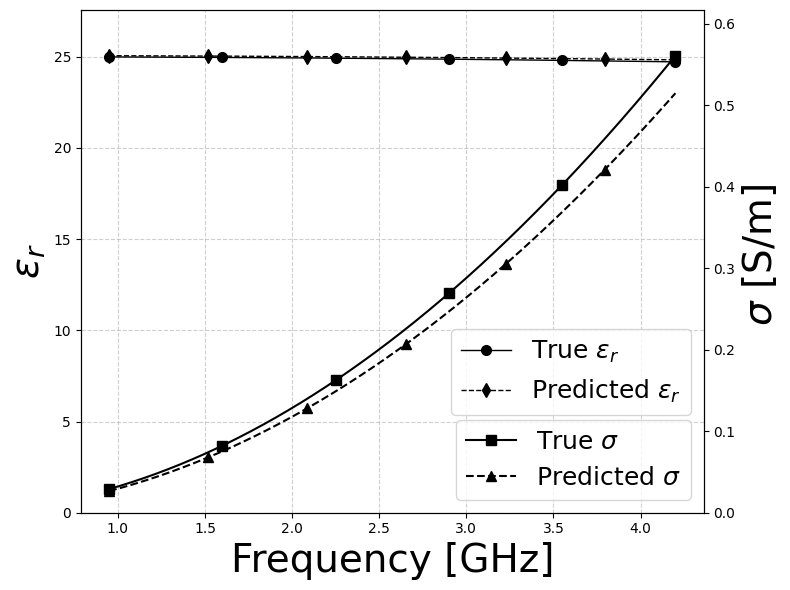

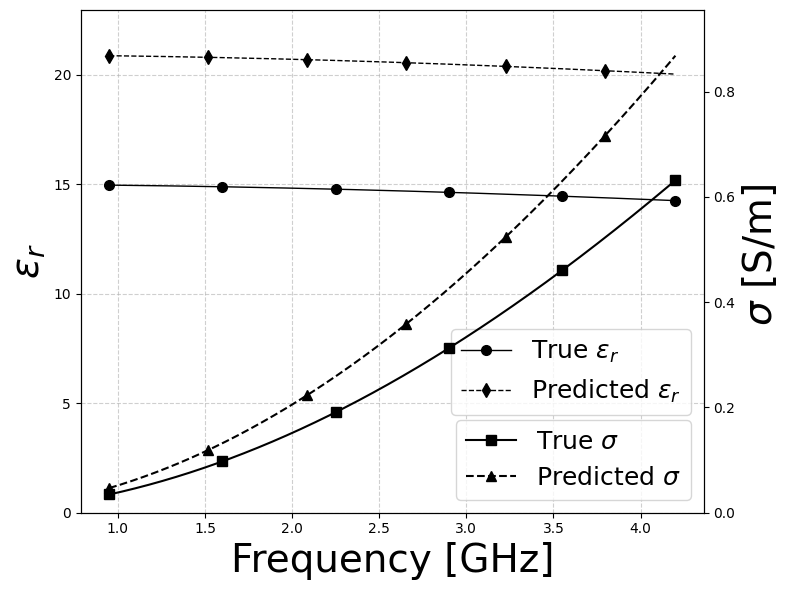

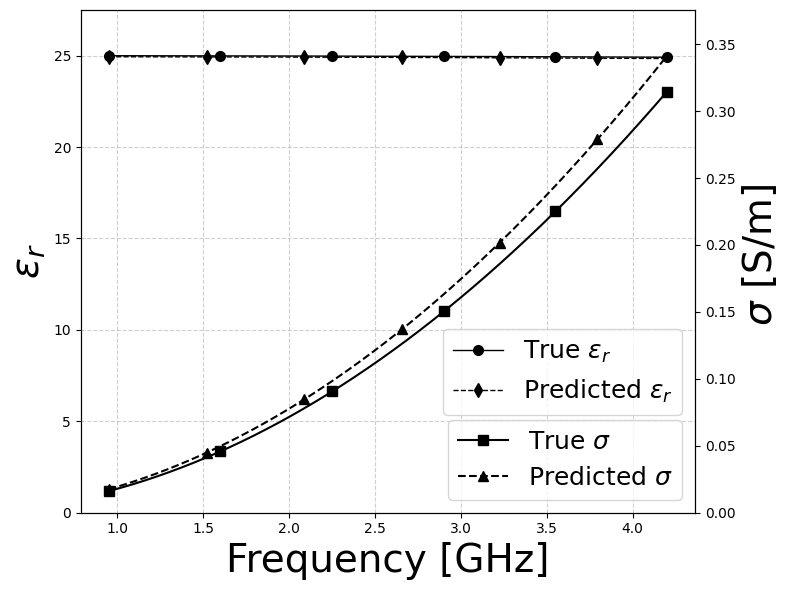

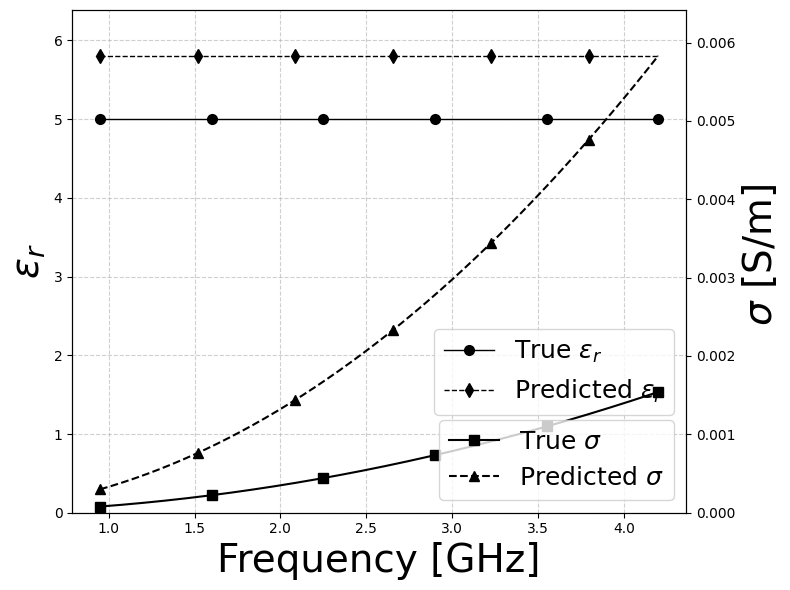

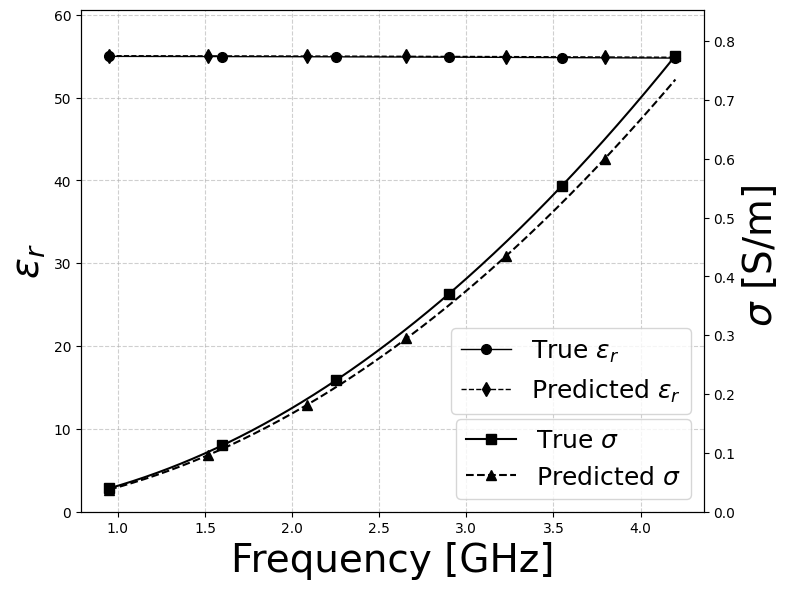

...

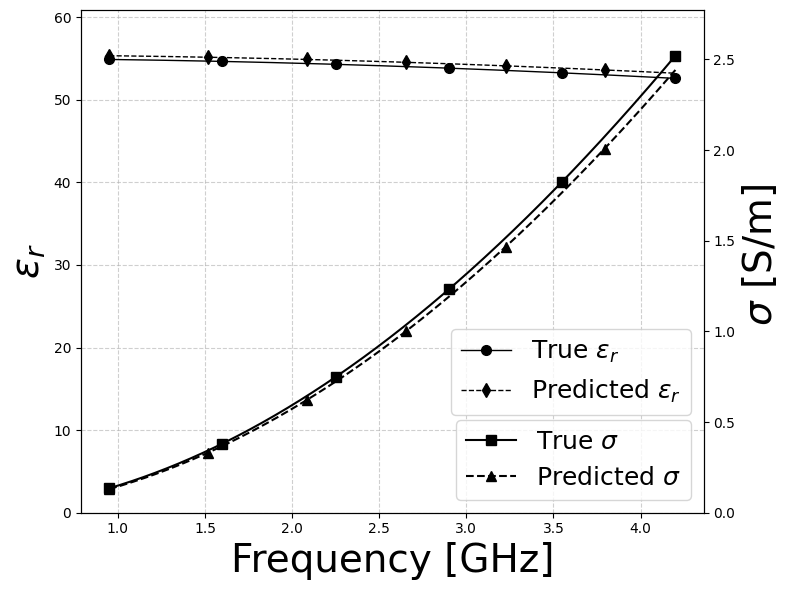

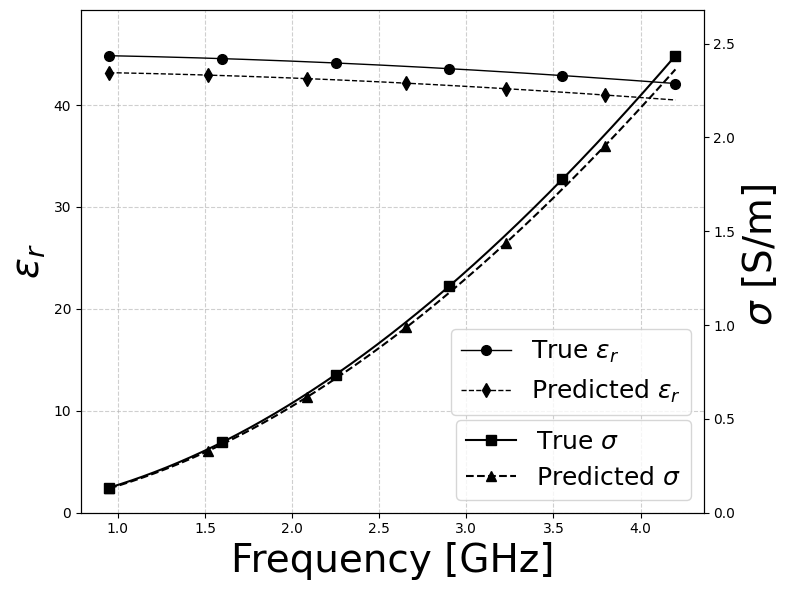

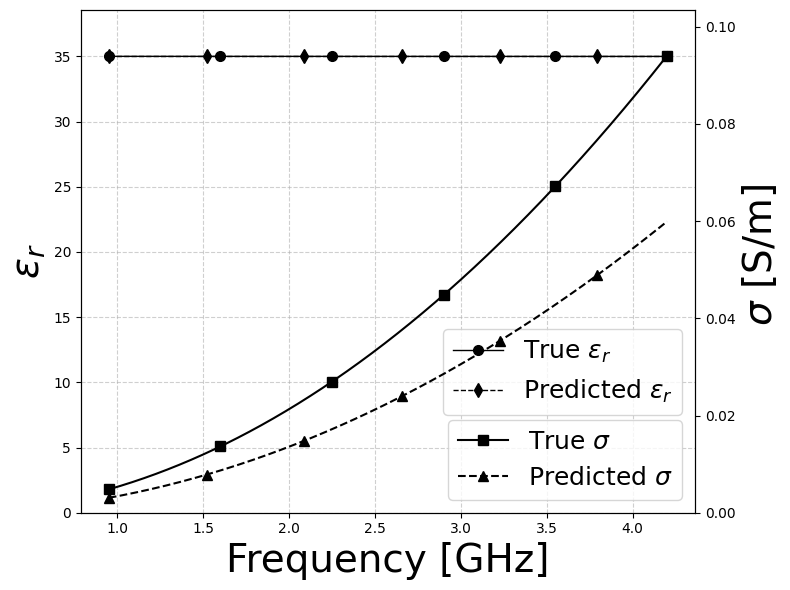

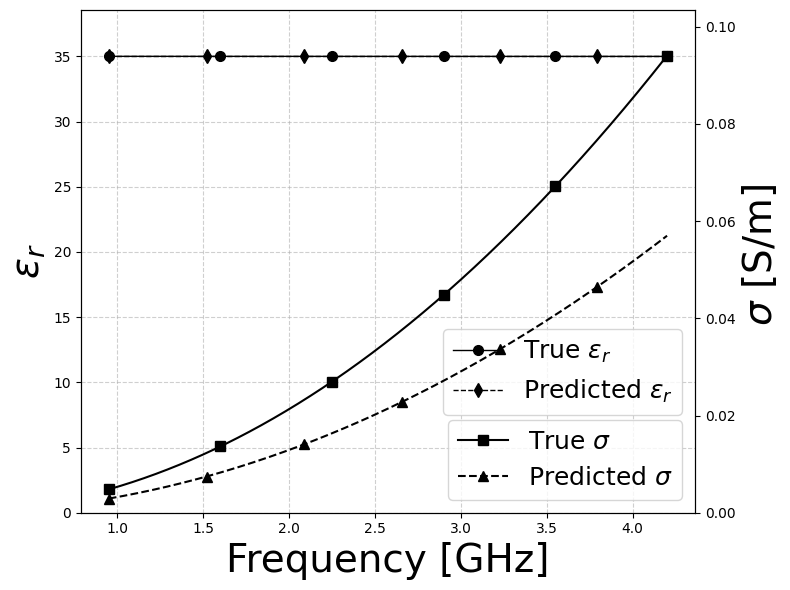

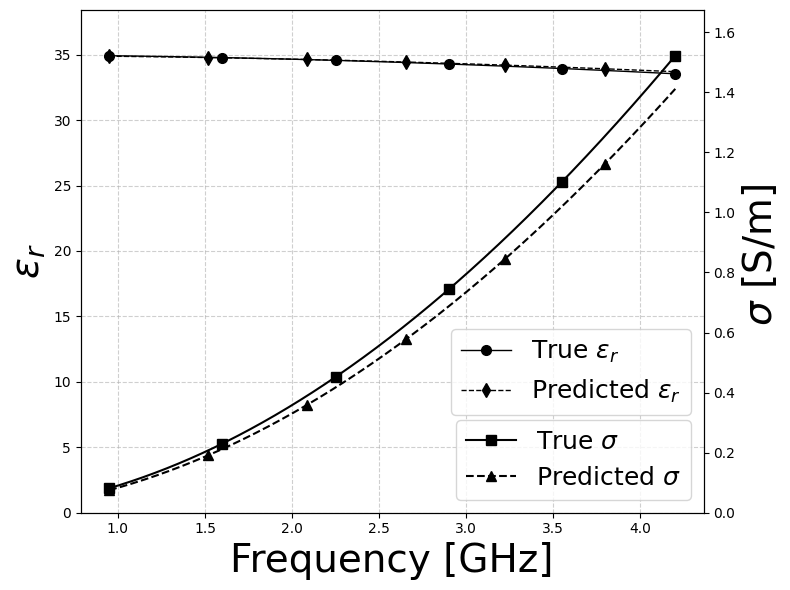

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# Ensure reproducibility
np.random.seed(0)

for i in range(preds.shape[0]):

    # Define Debye parameters
    eps_inf_opt = 4.5
    eps_s_opt = preds[i, 0]
    tau_opt = preds[i, 1]

    eps_inf_real = 4.5
    eps_s_real = y_test[i, 0]
    tau_real = y_test[i, 1]

    # Define frequency array (in GHz)
    freq = np.linspace(0.95, 4.2, 1001)

    # Calculate permittivity
    epsilon_1 = eps_inf_opt + (eps_s_opt - eps_inf_opt) / (1 + 1j * 2 * np.pi * freq * 1e9 * tau_opt * 1e-12)
    epsilon_real = eps_inf_real + (eps_s_real - eps_inf_real) / (1 + 1j * 2 * np.pi * freq * 1e9 * tau_real * 1e-12)

    eps_r_1 = np.real(epsilon_1)
    eps_i_1 = np.imag(epsilon_1)
    eps_r_real = np.real(epsilon_real)
    eps_i_real = np.imag(epsilon_real)

    eps0 = 8.8541878128e-12

    # Calculate conductivity
    cond_1 = -eps_i_1 * 2 * np.pi * freq * 1e9 * eps0
    cond_real = -eps_i_real * 2 * np.pi * freq * 1e9 * eps0

    # Save arrays using a higher precision
    np.savetxt(f'./test_results_csv/eps_pred_{i}.csv', eps_r_1, delimiter=",", fmt='%.16e')
    np.savetxt(f'./test_results_csv/eps_real_{i}.csv', eps_r_real, delimiter=",", fmt='%.16e')
    np.savetxt(f'./test_results_csv/cond_pred_{i}.csv', cond_1, delimiter=",", fmt='%.16e')
    np.savetxt(f'./test_results_csv/cond_real_{i}.csv', cond_real, delimiter=",", fmt='%.16e')

    # Save Excel versions
    pd.DataFrame(eps_r_1).to_excel(f'./test_results_xlx/eps_pred_{i}.xlsx', index=False)
    pd.DataFrame(eps_r_real).to_excel(f'./test_results_xlx/eps_real_{i}.xlsx', index=False)
    pd.DataFrame(cond_1).to_excel(f'./test_results_xlx/cond_1_{i}.xlsx', index=False)
    pd.DataFrame(cond_real).to_excel(f'./test_results_xlx/cond_real_{i}.xlsx', index=False)

    # Create a figure and axis for plotting
    fig, ax1 = plt.subplots(figsize=(8, 6))

    # Plot permittivity on the left y-axis with black color and markers
    ax1.plot(freq, eps_r_real, 'ko-', label='True $\epsilon_r$', linewidth=1, markevery=200, markersize=7)
    ax1.plot(freq, eps_r_1, 'kd--', label='Predicted $\epsilon_r$', linewidth=1, markevery=175, markersize=7)
    ax1.set_xlabel('Frequency [GHz]', fontsize=28)
    ax1.set_ylabel('$\epsilon_r$', color='black', fontsize=28)
    ax1.tick_params(axis='y', labelcolor='black')
    ax1.legend(fontsize=18, loc='lower right', bbox_to_anchor=(1, 0.17))
    ax1.grid(True, linestyle='--', alpha=0.6)

    # Set y-limits for permittivity plot
    y_min = min(np.min(eps_r_1), np.min(eps_r_real))
    y_max = 1.1 * max(np.max(eps_r_1), np.max(eps_r_real))
    if y_min >= 0:
        ax1.set_ylim(0, y_max)

    # Create a second y-axis for conductivity
    ax2 = ax1.twinx()

    # Plot conductivity on the right y-axis with black color and different markers
    ax2.plot(freq, cond_real, 'ks-', label='True $\sigma$', markevery=200, markersize=7)
    ax2.plot(freq, cond_1, 'k^--', label='Predicted $\sigma$', markevery=175, markersize=7)
    ax2.set_ylabel(' $\sigma$ [S/m]', color='black', fontsize=28)
    ax2.tick_params(axis='y', labelcolor='black')
    ax2.legend(fontsize=18, loc='lower right')

    # Set y-limits for conductivity plot
    y_min = min(np.min(cond_1), np.min(cond_real))
    y_max = 1.1 * max(np.max(cond_1), np.max(cond_real))
    if y_min >= 0:
        ax2.set_ylim(0, y_max)

    # Save and show the plot
    fig.tight_layout()
    plt.savefig(f'./test_results/test_permittivity_conductivity_{i}.png', dpi=300)
    plt.show()


# neural architecture search for complex-valued networks

In [ ]:
!pip install keras-tuner==1.4.5

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 129.5/129.5 kB 1.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 950.8/950.8 kB 10.8 MB/s eta 0:00:00


In [ ]:
import tensorflow as tf
import keras_tuner
# from keras_tuner.tuners import RandomSearch
# from kerastuner.engine.hyperparameters import HyperParameters
from tensorflow.keras.layers import Dense
from tensorflow.keras.optimizers import Adam
import cvnn.layers as complex_layers

# Define a function to build the model with variable neurons
def build_model(hp):
    model_complex = tf.keras.models.Sequential()
    model_complex.add(complex_layers.ComplexInput(input_shape=(4004,), dtype=tf.complex64))

    # Define the number of neurons for each layer as a hyperparameter
    # units = [hp.Int(f'units_{i}', min_value=8, max_value=512, step=8, sampling="linear") for i in range(4)]
    units = [hp.Choice(f'units_{i}', [64, 128, 256, 512]) for i in range(5)]

    # print(units)

    # Add ComplexDense layers with variable number of neurons
    for i, num_units in enumerate(units):
        model_complex.add(complex_layers.ComplexDense(units=num_units, activation='cart_leaky_relu'))

    model_complex.add(complex_layers.ComplexDense(units=32, activation='convert_to_real_with_abs'))
    # Add ComplexToReal and Dense output layer
    # model_complex.add(ComplexToReal())
    model_complex.add(Dense(units=2, activation='linear'))

    # Compile the model
    model_complex.compile(loss='mean_squared_error', optimizer=Adam(), metrics=['mean_squared_error'])

    # model_complex.summary()

    return model_complex

# Initialize Hyperparameters object
hp = keras_tuner.HyperParameters()

# hp.Float(
#     "learning_rate",
#     min_value=0.0001,
#     max_value=1,
#     step=10,
#     sampling="log")

build_model(hp)

# Define the tuner
tuner = keras_tuner.RandomSearch(
    hypermodel = build_model,
    objective=keras_tuner.Objective("val_loss", direction="min"),
    max_trials=100,  # Adjust the number of trials as needed
    tune_new_entries=False,
    loss="mean_squared_error",
    metrics=["mean_squared_error"],
    executions_per_trial=1,
    hyperparameters=hp,
    overwrite=True,
    directory='nas_logs',
    project_name='complex_model_nas'
)

tuner.search(X_train, y_train, batch_size = batch_size, validation_data=(X_test, y_test), epochs=200, callbacks=[lr_scheduler])  # Adjust epochs as needed
# Perform the search
tuner.search_space_summary()

# Get the best model
best_model = tuner.get_best_models(num_models=1)[0]

Trial 100 Complete [00h 01m 55s]
val_loss: 15.72610855102539

Best val_loss So Far: 9.281227111816406
Total elapsed time: 03h 33m 01s
Search space summary
Default search space size: 5
units_0 (Choice)
{'default': 64, 'conditions': [], 'values': [64, 128, 256, 512], 'ordered': True}
units_1 (Choice)
{'default': 64, 'conditions': [], 'values': [64, 128, 256, 512], 'ordered': True}
units_2 (Choice)
{'default': 64, 'conditions': [], 'values': [64, 128, 256, 512], 'ordered': True}
units_3 (Choice)
{'default': 64, 'conditions': [], 'values': [64, 128, 256, 512], 'ordered': True}
units_4 (Choice)
{'default': 64, 'conditions': [], 'values': [64, 128, 256, 512], 'ordered': True}


In [ ]:
best_model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 complex_dense (ComplexDens  (None, 128)               1025280   
 e)                                                              
                                                                 
 complex_dense_1 (ComplexDe  (None, 512)               132096    
 nse)                                                            
                                                                 
 complex_dense_2 (ComplexDe  (None, 64)                65664     
 nse)                                                            
                                                                 
 complex_dense_3 (ComplexDe  (None, 512)               66560     
 nse)                                                            
                                                                 
 complex_dense_4 (ComplexDe  (None, 512)               5